<a href="https://colab.research.google.com/github/goohyunju/-21-2/blob/ghjass/yey.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# colab 시작

In [ ]:
# Colab Path 설정
import os, sys
from google.colab import drive

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
!pip install pm4py -- upgrade

ERROR: Could not find a version that satisfies the requirement upgrade (from versions: none)
ERROR: No matching distribution found for upgrade


In [ ]:
!pip install pm4py

In [ ]:
# 모델 그림 그려주던 버전 0.10.1
# !pip install graphviz=="0.18"

  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1


In [ ]:
import pandas as pd
import pm4py
import numpy as np
# from pm4py.objects.log.importer.xes import importer as xes_importer
# from pm4py.objects.conversion.log import converter as xes_converter

In [ ]:
from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter
import matplotlib.pyplot as plt

# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_x_rework_x.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_end_activity_deleted_data.csv')
data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/activity_name_modified_data(rework).csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data(noRework).csv')
data = data.iloc[:, 1:]
data = dataframe_utils.convert_timestamp_columns_in_df(data)
data = data.sort_values('time:timestamp')
# 데이터프레임 형태
event_log_pm4py = pm4py.format_dataframe(data, case_id='case:concept:name', activity_key='concept:name',
                                         timestamp_key='time:timestamp', timest_format='%Y-%m-%d %H:%M:%S%z')
event_df = event_log_pm4py
# 로그 형태
event_log = log_converter.apply(event_log_pm4py)

# 데이터 열 이름 및 순서 수정

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/Production_Data.csv')

In [ ]:
data.head()

,Case ID,Activity,Resource,Start Timestamp,Complete Timestamp,Span,Work Order Qty,Part Desc.,Worker ID,Report Type,Qty Completed,Qty Rejected,Qty for MRB,Rework
0,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/29 23:24:00.000,2012/01/30 05:43:00.000,006:19,10,Cable Head,ID4932,S,1,0,0,NaN
1,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 05:44:00.000,2012/01/30 06:42:00.000,000:58,10,Cable Head,ID4932,D,1,0,0,NaN
2,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 06:59:00.000,2012/01/30 07:21:00.000,000:22,10,Cable Head,ID4167,S,0,0,0,NaN
3,Case 1,Turning & Milling - Machine 4,Machine 4 - Turning & Milling,2012/01/30 07:21:00.000,2012/01/30 10:58:00.000,003:37,10,Cable Head,ID4167,D,8,0,0,NaN
4,Case 1,Turning & Milling Q.C.,Quality Check 1,2012/01/31 13:20:00.000,2012/01/31 14:50:00.000,001:30,10,Cable Head,ID4163,D,9,1,0,NaN


In [ ]:
data.columns, len(data)

(Index(['Case ID', 'Activity', 'Resource', 'Start Timestamp',
        'Complete Timestamp', 'Span', 'Work Order  Qty', 'Part Desc.',
        'Worker ID', 'Report Type', 'Qty Completed', 'Qty Rejected',
        'Qty for MRB', 'Rework'],
       dtype='object'), 4543)

In [ ]:
len(data[data['Case ID']=='Case 7']), ((data[data['Case ID']=='Case 7'])['Rework']).value_counts

(13, <bound method IndexOpsMixin.value_counts of 3893    NaN
 3894    NaN
 3895    NaN
 3896    NaN
 3897    NaN
 3898    NaN
 3899    NaN
 3900    NaN
 3901    NaN
 3902    NaN
 3903    NaN
 3904    NaN
 3905    NaN
 Name: Rework, dtype: object>)

In [ ]:
data['Report Type'].value_counts()

D    3785
S     705
B      53
Name: Report Type, dtype: int64

In [ ]:
data['Resource'].value_counts()

Quality Check 1                  1193
Machine 1 - Lapping               369
Packing                           277
Machine 3 - Round Grinding        275
Machine 2 - Round Grinding        273
Machine 4 - Turning & Milling     271
Machine 5 - Turning & Milling     264
Machine 6 - Turning & Milling     261
Machine 7- Laser Marking          252
Machine 8 - Turning & Milling     219
Machine 9 - Turning & Milling     198
Machine 10 - Grinding             178
Machine 27 - Grinding             153
Machine 11 - Grinding             124
Machine 12 - Grinding              93
Machine 15 - Turning               49
Wire Cut - Machine 13              21
Machine 14 - Milling               18
Machine 16 - Milling               10
Manual Deburring                    9
Machine 19 - Grinding               6
Machine 18 - Wire Cutting           6
Machine 22 - Milling                4
Machine 17 - Sinking                4
Machine 21 - Turning                4
Machine 23 - Turning                3
Oven        

In [ ]:
data['Qty for MRB'].value_counts()

0     4533
1        4
3        2
5        2
9        1
76       1
Name: Qty for MRB, dtype: int64

In [ ]:
data[data['Qty for MRB'] > 0]

,Case ID,Activity,Resource,Start Timestamp,Complete Timestamp,Span,Work Order Qty,Part Desc.,Worker ID,Report Type,Qty Completed,Qty Rejected,Qty for MRB,Rework
1704,Case 219,Final Inspection Q.C.,Quality Check 1,2012-01-15 12:14:00+00:00,2012-01-15 12:15:00+00:00,000:01,30,Cable Head,ID4493,D,19,1,9,NaN
1355,Case 199,Final Inspection Q.C.,Quality Check 1,2012-01-19 07:00:00+00:00,2012-01-19 08:40:00+00:00,001:40,180,Cable Head,ID4163,D,0,0,1,NaN
1090,Case 187,Final Inspection Q.C.,Quality Check 1,2012-01-27 06:49:00+00:00,2012-01-27 08:00:00+00:00,001:11,200,Cable Head,ID4493,D,0,0,5,NaN
1056,Case 185,Final Inspection Q.C.,Quality Check 1,2012-01-30 11:00:00+00:00,2012-01-30 12:18:00+00:00,001:18,17,Cable Head,ID4287,D,0,0,5,NaN
924,Case 18,Turning & Milling Q.C.,Quality Check 1,2012-01-31 07:00:00+00:00,2012-01-31 07:14:00+00:00,000:14,557,Cable Head,ID4163,D,2,0,76,NaN
2449,Case 256,Round Grinding - Q.C.,Quality Check 1,2012-02-14 07:30:00+00:00,2012-02-14 08:40:00+00:00,001:10,100,Spinner,ID4287,D,6,0,3,NaN
4116,Case 77,Final Inspection Q.C.,Quality Check 1,2012-02-22 07:00:00+00:00,2012-02-22 08:40:00+00:00,001:40,40,Gauge,ID4163,D,0,0,1,NaN
1808,Case 225,Final Inspection Q.C.,Quality Check 1,2012-02-23 15:20:00+00:00,2012-02-23 16:10:00+00:00,000:50,185,Cable Head,ID4163,D,0,0,3,NaN
2502,Case 257,Final Inspection Q.C.,Quality Check 1,2012-02-29 08:30:00+00:00,2012-02-29 08:40:00+00:00,000:10,150,Cable Head,ID4163,D,0,0,1,NaN
3019,Case 271,Final Inspection Q.C.,Quality Check 1,2012-03-12 11:59:00+00:00,2012-03-12 13:14:00+00:00,000:00,150,Cable Head,ID4493,D,6,0,1,NaN


In [ ]:
data['Part Desc.'].value_counts()

Cable Head            1291
Ballnut                875
Spur Gear              420
Housing                196
Punch Holder           173
Plug                   122
Bearing                119
Piston                 100
Gauge                   91
Adapter                 89
Spindle                 75
Drill                   73
Clamp                   65
Spinner                 64
Socket                  60
Fastener                59
Punch Plate             54
Electrical Contact      51
Tube                    49
Flange                  49
Cast                    40
Flange Bolt             39
Shim                    37
Wheel Shaft             33
Drum                    29
Ring                    27
Adjusting Nut           26
Locknut                 23
Bushing                 22
Compound Dies           22
O-Ring                  20
Wheel                   18
Hinge                   18
Barrel                  14
Blade                   14
Cutting Wheel           14
Slip Ring Adapter       14
A

In [ ]:
data.rename(columns={'Case ID':'case:concept:name', 'Activity':'concept:name', 'Resource':'resource',
                     'Start Timestamp':'time:start', 'Complete Timestamp':'time:complete', 'Span':'time:span',
                     'Part Desc.':'component', 'Worker ID':'worker_id', 'Work Order  Qty':'qty:order',
                     'Report Type':'report_type', 'Qty Completed':'qty:completed', 'Qty Rejected':'qty:rejected',
                     'Qty for MRB':'qty:mrb', 'Rework':'rework'}, inplace=True)

In [ ]:
data = data[['case:concept:name', 'concept:name', 'time:start', 'time:complete', 'time:span',
             'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb',
             'component', 'report_type', 'rework']]

In [ ]:
data

,case:concept:name,concept:name,time:start,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework
0,Case 1,Turning & Milling - Machine 4,2012/01/29 23:24:00.000,2012/01/30 05:43:00.000,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN
1,Case 1,Turning & Milling - Machine 4,2012/01/30 05:44:00.000,2012/01/30 06:42:00.000,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN
2,Case 1,Turning & Milling - Machine 4,2012/01/30 06:59:00.000,2012/01/30 07:21:00.000,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN
3,Case 1,Turning & Milling - Machine 4,2012/01/30 07:21:00.000,2012/01/30 10:58:00.000,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN
4,Case 1,Turning & Milling Q.C.,2012/01/31 13:20:00.000,2012/01/31 14:50:00.000,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4538,Case 99,Laser Marking - Machine 7,2012/03/26 09:14:00.000,2012/03/26 10:12:00.000,000:58,Machine 7- Laser Marking,ID0998,507,160,0,0,Drill,D,NaN
4539,Case 99,Lapping - Machine 1,2012/03/26 10:12:00.000,2012/03/26 12:12:00.000,002:00,Machine 1 - Lapping,ID0998,507,160,0,0,Drill,D,NaN
4540,Case 99,Final Inspection Q.C.,2012/03/28 17:35:00.000,2012/03/28 17:59:00.000,000:24,Quality Check 1,ID4618,507,0,0,0,Drill,D,NaN
4541,Case 99,Final Inspection Q.C.,2012/03/29 08:00:00.000,2012/03/29 11:54:00.000,003:54,Quality Check 1,ID4618,507,160,0,0,Drill,D,NaN


In [ ]:
for i in range(len(data)):
  data.iloc[i,0] = (data.iloc[i,0]).replace('Case ', '')

In [ ]:
data

,case:concept:name,concept:name,time:start,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework
0,1,Turning & Milling - Machine 4,2012/01/29 23:24:00.000,2012/01/30 05:43:00.000,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN
1,1,Turning & Milling - Machine 4,2012/01/30 05:44:00.000,2012/01/30 06:42:00.000,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN
2,1,Turning & Milling - Machine 4,2012/01/30 06:59:00.000,2012/01/30 07:21:00.000,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN
3,1,Turning & Milling - Machine 4,2012/01/30 07:21:00.000,2012/01/30 10:58:00.000,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN
4,1,Turning & Milling Q.C.,2012/01/31 13:20:00.000,2012/01/31 14:50:00.000,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4538,99,Laser Marking - Machine 7,2012/03/26 09:14:00.000,2012/03/26 10:12:00.000,000:58,Machine 7- Laser Marking,ID0998,507,160,0,0,Drill,D,NaN
4539,99,Lapping - Machine 1,2012/03/26 10:12:00.000,2012/03/26 12:12:00.000,002:00,Machine 1 - Lapping,ID0998,507,160,0,0,Drill,D,NaN
4540,99,Final Inspection Q.C.,2012/03/28 17:35:00.000,2012/03/28 17:59:00.000,000:24,Quality Check 1,ID4618,507,0,0,0,Drill,D,NaN
4541,99,Final Inspection Q.C.,2012/03/29 08:00:00.000,2012/03/29 11:54:00.000,003:54,Quality Check 1,ID4618,507,160,0,0,Drill,D,NaN


In [ ]:
data.to_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data.csv')

# Rework activity명 수정한 데이터 생성

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data.csv')
data = data.iloc[:, 1:]
data['concept:name'].value_counts()
# data['rework'].value_counts() # 32
# data['resource'].value_counts() # resource는 수정 x

Final Inspection Q.C.                      550
Turning & Milling Q.C.                     522
Lapping - Machine 1                        370
Packing                                    277
Round Grinding - Machine 3                 273
Round Grinding - Machine 2                 267
Turning & Milling - Machine 4              262
Turning & Milling - Machine 6              261
Turning & Milling - Machine 5              259
Laser Marking - Machine 7                  252
Turning & Milling - Machine 8              180
Turning & Milling - Machine 9              158
Turning & Milling - Machine 10             149
Flat Grinding - Machine 11                 113
Round Grinding - Manual                     84
Turning - Machine 8                         83
Round Grinding - Machine 12                 82
Grinding Rework - Machine 27                69
Round Grinding - Q.C.                       59
Turning Q.C.                                55
Turning - Machine 9                         33
Turn & Mill. 

In [ ]:
for i in range(len(data)):
  if "Rework " in data.iloc[i,1]:
    data.iloc[i,-1] = 'Y'
    data.iloc[i,1] = (data.iloc[i,1]).replace('Rework ', '')
    data.iloc[i,1] = (data.iloc[i,1]).replace(' Rework', '')
    data.iloc[i,1] = (data.iloc[i,1]).replace('Rework', '')
  else:
    continue

In [ ]:
data['concept:name'].value_counts()
# data['rework'].value_counts(), 123

Final Inspection Q.C.                      550
Turning & Milling Q.C.                     522
Lapping - Machine 1                        370
Packing                                    277
Round Grinding - Machine 3                 273
Round Grinding - Machine 2                 267
Turning & Milling - Machine 4              262
Turning & Milling - Machine 6              261
Turning & Milling - Machine 5              259
Laser Marking - Machine 7                  252
Turning & Milling - Machine 8              180
Turning & Milling - Machine 9              158
Turning & Milling - Machine 10             149
Flat Grinding - Machine 11                 113
Round Grinding - Manual                     84
Turning - Machine 8                         83
Round Grinding - Machine 12                 82
Grinding - Machine 27                       69
Round Grinding - Q.C.                       59
Turning Q.C.                                55
Turning - Machine 9                         33
Turn & Mill. 

In [ ]:
data.to_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data(noRework).csv')

# setup activity 포함 case 제거한 데이터 생성

In [ ]:
event_df[event_df['concept:name']=='Setup - Machine 4']

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
3894,7,Setup - Machine 4,2012-03-11 19:37:00+00:00,2012-03-11 21:30:00+00:00,001:53,Machine 4 - Turning & Milling,ID4932,8,0,0,0,Bearing,S,NaN,3894


In [ ]:
event_df[event_df['concept:name']=='Setup - Machine 8']

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
54,101,Setup - Machine 8,2012-03-13 18:47:00+00:00,2012-03-13 20:03:00+00:00,001:16,Machine 8 - Turning & Milling,ID4219,27,0,0,0,Housing,S,NaN,54


In [ ]:
drop_idx = event_df[event_df['case:concept:name'] == '7'].index
event_df2 = event_df.drop(drop_idx)
len(event_df), len(event_df2)

(4543, 4530)

In [ ]:
drop_idx = event_df[event_df['case:concept:name'] == '101'].index
event_df3 = event_df2.drop(drop_idx)
event_df3.reset_index(inplace=True, drop=True)

len(event_df), len(event_df2), len(event_df3)

(4543, 4530, 4513)

In [ ]:
event_df3.to_csv('/content/drive/MyDrive/데스팀플/data/setup_activity_delete_data.csv')

# activity명 변경한 데이터 생성

In [ ]:
event_df3[event_df3['concept:name']=='Fix - Machine 15M']
event_df3.iloc[3521,1] = 'Fix - Machine 15'

In [ ]:
event_df3[event_df3['case:concept:name']=='45']

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
3517,45,Turning & Milling - Machine 6,2012-03-20 14:22:00+00:00,2012-03-20 20:05:00+00:00,005:43,Machine 6 - Turning & Milling,ID4794,15,1,0,0,Spur Gear,S,NaN,3534
3518,45,Turning & Milling - Machine 6,2012-03-20 20:07:00+00:00,2012-03-20 23:19:00+00:00,003:12,Machine 6 - Turning & Milling,ID4529,15,1,0,0,Spur Gear,S,NaN,3535
3519,45,Turning & Milling - Machine 6,2012-03-20 23:21:00+00:00,2012-03-21 03:23:00+00:00,004:02,Machine 6 - Turning & Milling,ID4529,15,13,0,0,Spur Gear,D,NaN,3536
3520,45,Turning & Milling Q.C.,2012-03-21 07:09:00+00:00,2012-03-21 10:03:00+00:00,002:54,Quality Check 1,ID4618,15,0,0,0,Spur Gear,D,NaN,3537
3521,45,Fix - Machine 15,2012-03-26 14:21:00+00:00,2012-03-26 15:57:00+00:00,001:36,Machine 8 - Turning & Milling,ID0997,15,0,0,0,Spur Gear,D,NaN,3538
3522,45,Turning & Milling Q.C.,2012-03-28 06:53:00+00:00,2012-03-28 08:08:00+00:00,000:00,Quality Check 1,ID4618,15,10,0,0,Spur Gear,D,NaN,3539
3523,45,Turning & Milling Q.C.,2012-03-28 06:54:00+00:00,2012-03-28 07:31:00+00:00,000:37,Quality Check 1,ID4618,15,0,5,0,Spur Gear,D,NaN,3540


In [ ]:
event_df3[event_df3['concept:name']=='SETUP     Turning & Milling - Machine 5']
event_df3.iloc[308,1] = 'Turning - Machine 5'
event_df3.iloc[3402,1] = 'Turning - Machine 5'
event_df3.iloc[4306,1] = 'Turning - Machine 5'

In [ ]:
event_df3[event_df3['concept:name']=='SETUP     Turning & Milling - Machine 5']

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index


In [ ]:
event_df3.to_csv('/content/drive/MyDrive/데스팀플/data/activity_name_modified_data.csv')

# EDA




In [ ]:
from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter

# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_x_rework_x.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_end_activity_deleted_data.csv')
data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/activity_name_modified_data(rework).csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data(noRework).csv')
data = data.iloc[:, 1:]
data = dataframe_utils.convert_timestamp_columns_in_df(data)
data = data.sort_values('time:timestamp')
event_log = log_converter.apply(data)

In [ ]:
event_log_pm4py = pm4py.format_dataframe(data, case_id='case:concept:name', activity_key='concept:name',
                                         timestamp_key='time:start', timest_format='%Y-%m-%d %H:%M:%S%z')

In [ ]:
data

,case:concept:name,concept:name,time:start,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework
818,178,Round Grinding - Machine 3,2012-01-02 00:00:00+00:00,2012-01-02 04:50:00+00:00,004:50,Machine 3 - Round Grinding,ID4445,250,31,0,0,Cable Head,D,NaN
1131,189,Turning & Milling Q.C.,2012-01-02 00:00:00+00:00,2012-01-02 01:15:00+00:00,000:00,Quality Check 1,ID4163,8,0,1,0,Tube,D,NaN
2088,238,Turning & Milling - Machine 4,2012-01-02 01:00:00+00:00,2012-01-02 07:00:00+00:00,006:00,Machine 4 - Turning & Milling,ID4794,320,0,0,0,Electrical Contact,S,NaN
2388,255,Turning - Machine 8,2012-01-02 07:00:00+00:00,2012-01-02 18:00:00+00:00,011:00,Machine 15 - Turning,ID0997,40,40,0,0,Bushing,D,NaN
2089,238,Turning & Milling - Machine 4,2012-01-02 07:00:00+00:00,2012-01-02 14:00:00+00:00,007:00,Machine 4 - Turning & Milling,ID4529,320,0,0,0,Electrical Contact,S,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
630,137,Turning & Milling Q.C.,2012-03-30 10:55:00+00:00,2012-03-30 11:50:00+00:00,000:55,Quality Check 1,ID4163,15,0,0,0,Housing,D,NaN
3608,5,Turning & Milling - Machine 8,2012-03-30 11:14:00+00:00,2012-03-30 11:43:00+00:00,000:29,Machine 8 - Turning & Milling,ID0997,15,8,0,0,Bearing,D,NaN
4164,78,Lapping - Machine 1,2012-03-30 11:31:00+00:00,2012-03-30 12:46:00+00:00,000:00,Machine 1 - Lapping,ID0998,230,18,0,0,Cable Head,D,NaN
4181,80,Round Grinding - Machine 3,2012-03-30 22:00:00+00:00,2012-03-31 01:00:00+00:00,003:00,Machine 3 - Round Grinding,ID4445,18,0,0,0,Cable Head,S,NaN


In [ ]:
# num of events, num of cases, start and end activities, average of case durations
def basic_data_analysis(event_log):
    num_events = len(event_log)
    num_cases = len(event_log['case:concept:name'].unique())
    start_activities = pm4py.get_start_activities(event_log)
    end_activities = pm4py.get_end_activities(event_log)
    mean_case_durations = np.round(np.mean(pm4py.stats.get_all_case_durations(event_log))/24/60/60, 2)
    print("Number of events: {}\nNumber of cases: {}\nStart activities: {}\nEnd activities: {}\nMean of case durations: {}".format(num_events, num_cases, start_activities, end_activities, mean_case_durations))

In [ ]:
basic_data_analysis(event_log_pm4py)

NameError: ignored

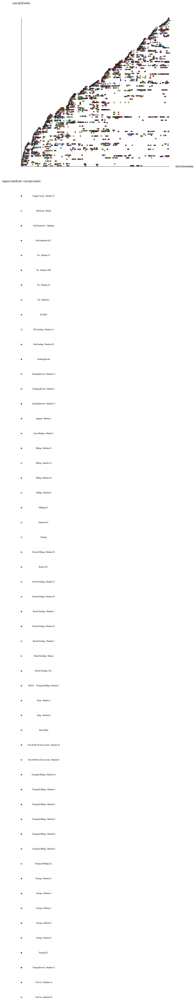

In [ ]:
pm4py.view_dotted_chart(event_log_pm4py)

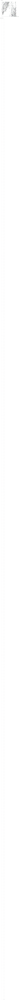

In [ ]:
pm4py.view_dotted_chart(event_log, format="png", attributes=["case:concept:name", "time:timestamp", "time:span"])

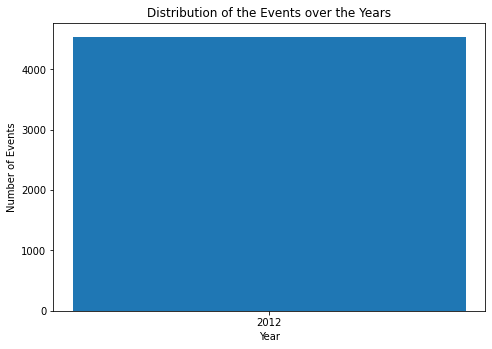

'\nThe possible values for the parameter distr_type are:\n\nhours: plots the distribution over the hours of a day.\ndays_week: plots the distribution over the days of a week.\ndays_month: plots the distribution over the days of a month.\nmonths: plots the distribution over the months of a year.\nyears: plots the distribution over the different years of the log.\n'

In [ ]:
pm4py.view_events_distribution_graph(event_log_pm4py, distr_type="years", format="png")
'''
The possible values for the parameter distr_type are:

hours: plots the distribution over the hours of a day.
days_week: plots the distribution over the days of a week.
days_month: plots the distribution over the days of a month.
months: plots the distribution over the months of a year.
years: plots the distribution over the different years of the log.
'''

In [ ]:
from pm4py.algo.discovery.batches import algorithm
batches = algorithm.apply(event_log_pm4py)

KeyError: ignored

In [ ]:
for act_res in batches:
    print("")
    print("activity: "+act_res[0][0]+" resource: "+act_res[0][1])
    print("number of distinct batches: "+str(act_res[1]))
    for batch_type in act_res[2]:
        print(batch_type, len(act_res[2][batch_type]))


'''ere are indeed different types of batches that are detected by our method:

Simultaneous: all the events in the batch have identical start and end timestamps.
Batching at start: all the events in the batch have identical start timestamp.
Batching at end: all the events in the batch have identical end timestamp.
Sequential batching: for all the consecutive events, the end of the first is equal to the start of the second.
Concurrent batching: for all the consecutive events that are not sequentially matched.'''

In [ ]:
event_log_pm4py['case:concept:name'] = pd.to_numeric(event_log_pm4py['case:concept:name'])

In [ ]:
event_log_pm4py.dtypes

case:concept:name                  int64
concept:name                      object
time:timestamp       datetime64[ns, UTC]
time:complete        datetime64[ns, UTC]
time:span                         object
resource                          object
worker_id                         object
qty:order                          int64
qty:completed                      int64
qty:rejected                       int64
qty:mrb                            int64
component                         object
report_type                       object
rework                            object
@@index                            int64
dtype: object

In [ ]:
from pm4py.algo.transformation.log_to_interval_tree import algorithm as log_to_interval_tree

it = log_to_interval_tree.apply(event_log_pm4py)

TypeError: ignored

In [ ]:
rework = pm4py.get_rework_cases_per_activity(event_log_pm4py)
rework

{'Change Version - Machine 22': 1,
 'Deburring - Manual': 2,
 'Final Inspection Q.C.': 113,
 'Fix - Machine 15': 1,
 'Fix - Machine 3': 1,
 'Fix EDM': 1,
 'Flat Grinding - Machine 11': 25,
 'Grinding - Machine 12': 1,
 'Grinding - Machine 2': 2,
 'Grinding - Machine 27': 9,
 'Grinding Rework': 3,
 'Lapping - Machine 1': 82,
 'Laser Marking - Machine 7': 49,
 'Milling - Machine 14': 1,
 'Milling - Machine 16': 2,
 'Packing': 54,
 'Round  Q.C.': 1,
 'Round Grinding - Machine 12': 22,
 'Round Grinding - Machine 19': 1,
 'Round Grinding - Machine 2': 39,
 'Round Grinding - Machine 23': 1,
 'Round Grinding - Machine 3': 40,
 'Round Grinding - Manual': 22,
 'Round Grinding - Q.C.': 12,
 'Turn & Mill. & Screw Assem - Machine 10': 2,
 'Turn & Mill. & Screw Assem - Machine 9': 1,
 'Turning & Milling - Machine 10': 15,
 'Turning & Milling - Machine 4': 30,
 'Turning & Milling - Machine 5': 30,
 'Turning & Milling - Machine 6': 35,
 'Turning & Milling - Machine 8': 33,
 'Turning & Milling - Machi

In [ ]:
from pm4py.statistics.rework.cases.log import get as rework_cases

dictio = rework_cases.apply(event_log_pm4py)

TypeError: ignored

# Filtering

In [ ]:
from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter
import matplotlib.pyplot as plt

# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_x_rework_x.csv')
data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_end_activity_deleted_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/activity_name_modified_data(rework).csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/activity_name_modified_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data(noRework).csv')
data = data.iloc[:, 1:]
data = dataframe_utils.convert_timestamp_columns_in_df(data)
data = data.sort_values('time:timestamp')
# 데이터프레임 형태
event_log_pm4py = pm4py.format_dataframe(data, case_id='case:concept:name', activity_key='concept:name',
                                         timestamp_key='time:timestamp', timest_format='%Y-%m-%d %H:%M:%S%z')
event_df = event_log_pm4py
# 로그 형태
event_log = log_converter.apply(event_log_pm4py)

In [ ]:
event_df = event_df[['case:concept:name', 'concept:name', 'time:timestamp',
       'time:complete', 'time:span', 'resource', 'worker_id', 'qty:order',
       'qty:completed', 'qty:rejected', 'qty:mrb', 'component', 'report_type',
       '@@index', 'rework']]

In [ ]:
len(data)

4122

In [ ]:
event_df

,case:concept:name,rework,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,@@index
2516,1,0,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,2516
2517,1,1,Turning & Milling - Machine 4,2012-01-30 05:44:00+00:00,2012-01-30 06:42:00+00:00,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,2517
2518,1,1,Turning & Milling - Machine 4,2012-01-30 06:59:00+00:00,2012-01-30 07:21:00+00:00,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,2518
2519,1,1,Turning & Milling - Machine 4,2012-01-30 07:21:00+00:00,2012-01-30 10:58:00+00:00,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,2519
2520,1,0,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,2520
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3094,99,0,Laser Marking - Machine 7,2012-03-26 09:14:00+00:00,2012-03-26 10:12:00+00:00,000:58,Machine 7- Laser Marking,ID0998,507,160,0,0,Drill,D,3094
3095,99,1,Lapping - Machine 1,2012-03-26 10:12:00+00:00,2012-03-26 12:12:00+00:00,002:00,Machine 1 - Lapping,ID0998,507,160,0,0,Drill,D,3095
3096,99,0,Final Inspection Q.C.,2012-03-28 17:35:00+00:00,2012-03-28 17:59:00+00:00,000:24,Quality Check 1,ID4618,507,0,0,0,Drill,D,3096
3097,99,1,Final Inspection Q.C.,2012-03-29 08:00:00+00:00,2012-03-29 11:54:00+00:00,003:54,Quality Check 1,ID4618,507,160,0,0,Drill,D,3097


In [ ]:
event_df['worker_id'].value_counts()

ID4618    411
ID0998    370
ID4163    300
ID4882    251
ID4287    249
ID4820    220
ID4794    174
ID4932    166
ID4529    154
ID4493    153
ID4385    150
ID4445    149
ID4528    146
ID4872    125
ID4641    120
ID0997    119
ID4355    115
ID4429    112
ID4167    109
ID4219     96
ID3846     93
ID0420     91
ID4132     87
ID4718     33
ID4491     24
ID3767     19
ID4291     16
ID0937     12
ID4162     12
ID4326      9
ID4861      6
ID4160      6
ID4360      5
ID4873      4
ID4140      3
ID3641      2
ID4442      2
ID4109      2
ID3998      2
ID3854      1
ID4142      1
ID4783      1
ID4955      1
ID3716      1
Name: worker_id, dtype: int64

In [ ]:
print(dict(event_log[0][0]).keys())

dict_keys(['concept:name', 'time:timestamp', 'time:complete', 'time:span', 'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb', 'component', 'report_type', 'rework', '@@index'])


In [ ]:
event_df[event_df['concept:name'] == 'SETUP     Turning & Milling - Machine 5']

,case:concept:name,rework,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,@@index


### Filtering case timespan

In [ ]:
event_df = event_log_pm4py
case_li = []
for i in range(len(event_df['case:concept:name'].value_counts())):
  case_li.append((int(event_df['case:concept:name'].value_counts().index[i]), event_df['case:concept:name'].value_counts()[i]))

# (case_id, case_freq)
case_li.sort()
len(case_li)

202

In [ ]:
# 이벤트 개수가 5 미만인 케이스 개수
tot = 0
for i in range(len(case_freq)):
  if case_freq[i] < 5:
    tot = tot + 1
tot

25

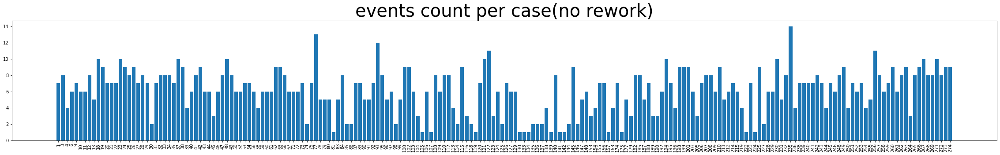

In [ ]:
# 케이스별 이벤트 개수 확인

x = np.arange(202)

case_id = []
case_freq = []

for i in range(202):
  case_id.append(case_li[i][0])
  case_freq.append(case_li[i][1])
plt.bar(x, case_freq)
plt.xticks(x, case_id)

plt.rcParams["figure.figsize"] = (40, 5)
plt.xticks(rotation=90)
plt.title('events count per case(no rework)',fontsize=40)

plt.show()

In [ ]:
len(activity_count)

202

In [ ]:
activity_count = []
for (id, freq) in case_li:
  activity_count.append((id, len(event_df[event_df['case:concept:name']==str(id)]['concept:name'].value_counts())))
activity_count

[(1, 7),
 (3, 8),
 (4, 4),
 (6, 6),
 (9, 7),
 (10, 6),
 (11, 6),
 (12, 8),
 (13, 5),
 (18, 10),
 (19, 9),
 (20, 7),
 (21, 7),
 (22, 7),
 (23, 10),
 (24, 9),
 (25, 8),
 (26, 9),
 (27, 7),
 (28, 8),
 (29, 7),
 (30, 2),
 (31, 7),
 (32, 8),
 (33, 8),
 (34, 8),
 (35, 7),
 (37, 10),
 (38, 9),
 (39, 4),
 (40, 6),
 (41, 8),
 (42, 9),
 (43, 6),
 (44, 6),
 (45, 3),
 (46, 6),
 (47, 8),
 (48, 10),
 (49, 8),
 (50, 6),
 (52, 6),
 (53, 7),
 (54, 7),
 (56, 6),
 (58, 4),
 (59, 6),
 (60, 6),
 (61, 6),
 (62, 9),
 (63, 9),
 (66, 8),
 (67, 6),
 (71, 6),
 (72, 6),
 (73, 7),
 (74, 2),
 (75, 7),
 (77, 13),
 (78, 5),
 (79, 5),
 (80, 5),
 (81, 1),
 (83, 5),
 (84, 8),
 (85, 2),
 (86, 2),
 (87, 7),
 (89, 7),
 (90, 5),
 (91, 5),
 (92, 7),
 (93, 12),
 (95, 8),
 (96, 5),
 (97, 6),
 (98, 2),
 (99, 5),
 (100, 9),
 (102, 9),
 (103, 6),
 (104, 3),
 (105, 1),
 (106, 6),
 (107, 1),
 (108, 8),
 (109, 6),
 (110, 8),
 (112, 8),
 (113, 4),
 (114, 2),
 (115, 9),
 (116, 3),
 (118, 2),
 (119, 1),
 (120, 7),
 (121, 10),
 (122, 11

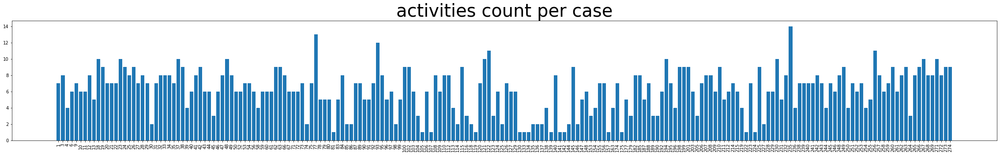

In [ ]:
# 케이스별 액티비티 개수 확인

x = np.arange(202)

case_id = []
activity_freq = []

for i in range(202):
  case_id.append(activity_count[i][0])
  activity_freq.append(activity_count[i][1])
plt.bar(x, activity_freq)
plt.xticks(x, case_id)

plt.rcParams["figure.figsize"] = (40, 5)
plt.xticks(rotation=90)
plt.title('activities count per case',fontsize=40)

plt.show()

In [ ]:
(event_df[event_df['case:concept:name'] == str(case_id[0])]).head()

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
0,1,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN,0
1,1,Turning & Milling - Machine 4,2012-01-30 05:44:00+00:00,2012-01-30 06:42:00+00:00,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN,1
2,1,Turning & Milling - Machine 4,2012-01-30 06:59:00+00:00,2012-01-30 07:21:00+00:00,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN,2
3,1,Turning & Milling - Machine 4,2012-01-30 07:21:00+00:00,2012-01-30 10:58:00+00:00,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN,3
4,1,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN,4


In [ ]:
start_time = []
end_time = []
for i in range(len(case_id)):
  start_time.append((event_df[event_df['case:concept:name'] == str(case_id[i])]).iloc[0,2])
  end_time.append((event_df[event_df['case:concept:name'] == str(case_id[i])]).iloc[-1,3])
print(len(start_time), len(end_time))

223 223


In [ ]:
end_time[0] - start_time[0]

Timedelta('18 days 01:36:00')

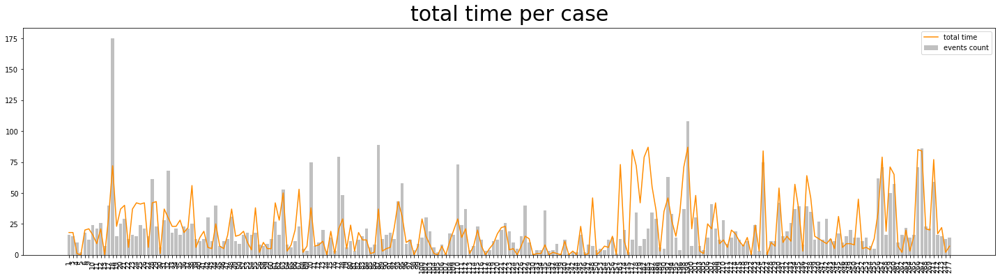

In [ ]:
# 케이스별 걸린 시간 확인

x = np.arange(223)
timespan = []
for i in range(223):
  timespan.append((end_time[i]-start_time[i]).days)
# 케이스 별 소요시간
plt.plot(x, timespan, color='darkorange', label='total time')
# 케이스 별 event 개수
plt.bar(x, case_freq, color='silver', label='events count')
plt.xticks(x, case_id)

plt.rcParams["figure.figsize"] = (25,6)
plt.xticks(rotation=90)
plt.legend()
plt.title('total time per case',fontsize=30, pad=10)

plt.show()

In [ ]:
activity_freq = []
for i in range(len(activity_li)):
  activity_freq.append(len(event_df[event_df['concept:name']==activity_li[i]]))
len(activity_freq)

50

In [ ]:
event_df['concept:name'].value_counts()

Final Inspection Q.C.                      547
Turning & Milling Q.C.                     520
Lapping - Machine 1                        367
Packing                                    275
Round Grinding - Machine 3                 273
Round Grinding - Machine 2                 267
Turning & Milling - Machine 6              261
Turning & Milling - Machine 5              259
Turning & Milling - Machine 4              257
Laser Marking - Machine 7                  250
Turning & Milling - Machine 8              173
Turning & Milling - Machine 9              158
Turning & Milling - Machine 10             149
Flat Grinding - Machine 11                 111
Round Grinding - Manual                     84
Turning - Machine 8                         83
Round Grinding - Machine 12                 80
Grinding - Machine 27                       69
Round Grinding - Q.C.                       59
Turning Q.C.                                55
Turning - Machine 9                         33
Turn & Mill. 

In [ ]:
activity_li = []
for i in range(len(event_df['concept:name'].value_counts())):
  activity_li.append(event_df['concept:name'].value_counts().index[i])
activity_li.sort()
activity_li

['Change Version - Machine 22',
 'Deburring - Manual',
 'Final Inspection - Weighting',
 'Final Inspection Q.C.',
 'Fix - Machine 15',
 'Fix - Machine 19',
 'Fix - Machine 3',
 'Fix EDM',
 'Flat Grinding - Machine 11',
 'Flat Grinding - Machine 26',
 'Grinding',
 'Grinding - Machine 12',
 'Grinding - Machine 2',
 'Grinding - Machine 27',
 'Lapping - Machine 1',
 'Laser Marking - Machine 7',
 'Milling - Machine 10',
 'Milling - Machine 14',
 'Milling - Machine 16',
 'Milling - Machine 28',
 'Milling - Machine 8',
 'Milling Q.C.',
 'Nitration Q.C.',
 'Packing',
 'Round  Q.C.',
 'Round Grinding - Machine 12',
 'Round Grinding - Machine 19',
 'Round Grinding - Machine 2',
 'Round Grinding - Machine 23',
 'Round Grinding - Machine 3',
 'Round Grinding - Manual',
 'Round Grinding - Q.C.',
 'Stress Relief',
 'Turn & Mill. & Screw Assem - Machine 10',
 'Turn & Mill. & Screw Assem - Machine 9',
 'Turning & Milling - Machine 10',
 'Turning & Milling - Machine 4',
 'Turning & Milling - Machine 5'

In [ ]:
event_df['time:span'][0]

'006:19'

In [ ]:
temp.iloc[j,2], temp.iloc[j,3]

(Timestamp('2012-03-08 04:30:00+0000', tz='UTC'),
 Timestamp('2012-03-08 07:00:00+0000', tz='UTC'))

In [ ]:
activity_freq_in_realtime = []
for i in range(len(activity_li)):
  activity_freq_in_realtime.append(0)
  temp = event_df[event_df['concept:name']==activity_li[i]]
  for j in range(len(temp)):
    if int((temp.iloc[j,3]-temp.iloc[j,2]).seconds/60) > 0:
      activity_freq_in_realtime[i] = activity_freq_in_realtime[i]+1

activity_freq_in_realtime

[4,
 9,
 1,
 546,
 3,
 1,
 2,
 4,
 109,
 1,
 11,
 11,
 6,
 69,
 362,
 250,
 1,
 18,
 10,
 2,
 1,
 1,
 4,
 275,
 2,
 80,
 6,
 267,
 3,
 273,
 84,
 59,
 2,
 28,
 7,
 149,
 257,
 259,
 261,
 173,
 158,
 520,
 4,
 8,
 5,
 83,
 33,
 55,
 21,
 6]

In [ ]:
int((event_df['time:complete'][0]-event_df['time:timestamp'][0]).seconds/60)

379

In [ ]:
type(event_df[event_df['concept:name']==activity_li[0]].iloc[0, 4]), event_df[event_df['concept:name']==activity_li[0]].iloc[0, 4]

(str, '005:39')

In [ ]:
def get_min(time_str):
  h, m = time_str.split(':')
  return int(h)*60 + int(m)

get_min(event_df[event_df['concept:name']==activity_li[0]].iloc[0, 4])

339

In [ ]:
event_df['time:span'].value_counts().index

Index(['000:00', '000:01', '001:00', '001:40', '002:00', '000:30', '001:30',
       '000:40', '000:20', '003:50',
       ...
       '023:25', '009:28', '004:51', '010:28', '008:18', '008:51', '008:31',
       '020:52', '009:59', '003:29'],
      dtype='object', length=662)

In [ ]:
temp = event_df[event_df['concept:name']==activity_li[41]].iloc[67,3] - event_df[event_df['concept:name']==activity_li[41]].iloc[67,2]
int(temp.seconds/60)

75

In [ ]:
timespan_li = []

for i in range(len(activity_li)):
  total = 0
  for j in range(len(event_df[event_df['concept:name']==activity_li[i]])):
    try:
      total = total+get_min(event_df[event_df['concept:name']==activity_li[i]].iloc[j,4])
    except:
      fixed_timespan = event_df[event_df['concept:name']==activity_li[i]].iloc[j,3] - event_df[event_df['concept:name']==activity_li[i]].iloc[j,2]
      total = total + int(fixed_timespan.seconds/60)
      continue
  # total = total / 60
  timespan_li.append((activity_li[i], total))

timespan_li

[('Change Version - Machine 22', 1967),
 ('Deburring - Manual', 869),
 ('Final Inspection - Weighting', 0),
 ('Final Inspection Q.C.', 58745),
 ('Fix - Machine 15', 255),
 ('Fix - Machine 19', 405),
 ('Fix - Machine 3', 154),
 ('Fix EDM', 661),
 ('Flat Grinding - Machine 11', 8601),
 ('Flat Grinding - Machine 26', 270),
 ('Grinding', 1087),
 ('Grinding - Machine 12', 1350),
 ('Grinding - Machine 2', 2069),
 ('Grinding - Machine 27', 10762),
 ('Lapping - Machine 1', 31159),
 ('Laser Marking - Machine 7', 10792),
 ('Milling - Machine 10', 0),
 ('Milling - Machine 14', 4657),
 ('Milling - Machine 16', 4573),
 ('Milling - Machine 28', 210),
 ('Milling - Machine 8', 479),
 ('Milling Q.C.', 0),
 ('Nitration Q.C.', 105),
 ('Packing', 0),
 ('Round  Q.C.', 60),
 ('Round Grinding - Machine 12', 13215),
 ('Round Grinding - Machine 19', 818),
 ('Round Grinding - Machine 2', 63551),
 ('Round Grinding - Machine 23', 461),
 ('Round Grinding - Machine 3', 62041),
 ('Round Grinding - Manual', 17894),
 

In [ ]:
timespan_li[0][1]

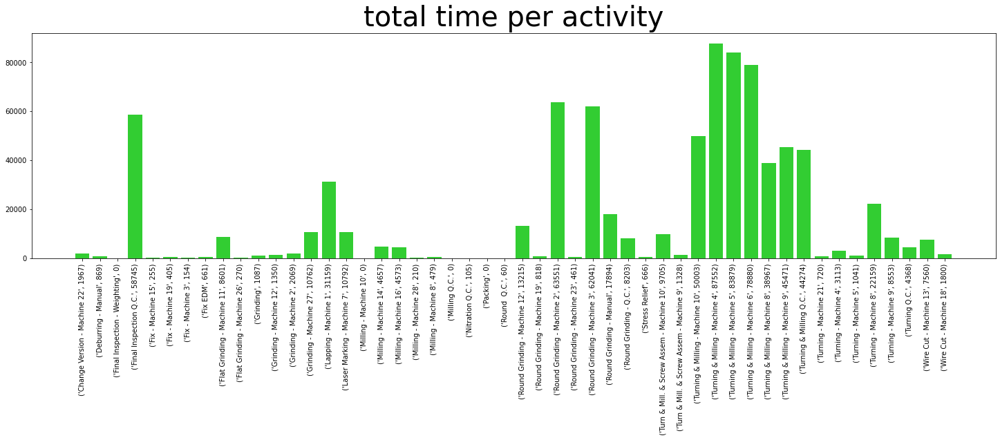

In [ ]:
# 액티비티별 총 소요시간 확인

x = np.arange(len(timespan_li))

timespan = []
for i in range(len(timespan_li)):
  timespan.append(timespan_li[i][1])

plt.bar(x, timespan, color='limegreen')

plt.xticks(x, timespan_li)

plt.rcParams["figure.figsize"] = (20, 7)
plt.title('total time per activity', fontsize=40, pad=10)
plt.xticks(rotation=90)

plt.show()

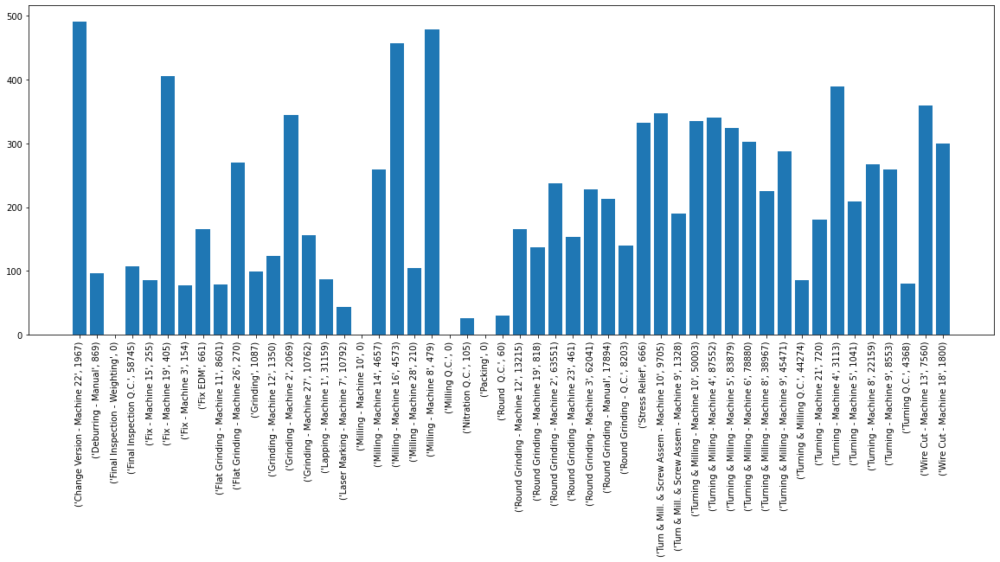

In [ ]:
# 액티비티별 평균 소요시간 확인

x = np.arange(len(timespan_li))

timespan = []
for i in range(len(timespan_li)):
  timespan.append(timespan_li[i][1])
avg_timespan = []
for j in range(len(timespan)):
  avg_timespan.append(timespan[j]/activity_freq_in_realtime[j])

# plt.bar(x, timespan)
plt.bar(x, avg_timespan)
plt.xticks(x, timespan_li)

plt.rcParams["figure.figsize"] = (20, 7)
plt.xticks(rotation=90)

plt.show()


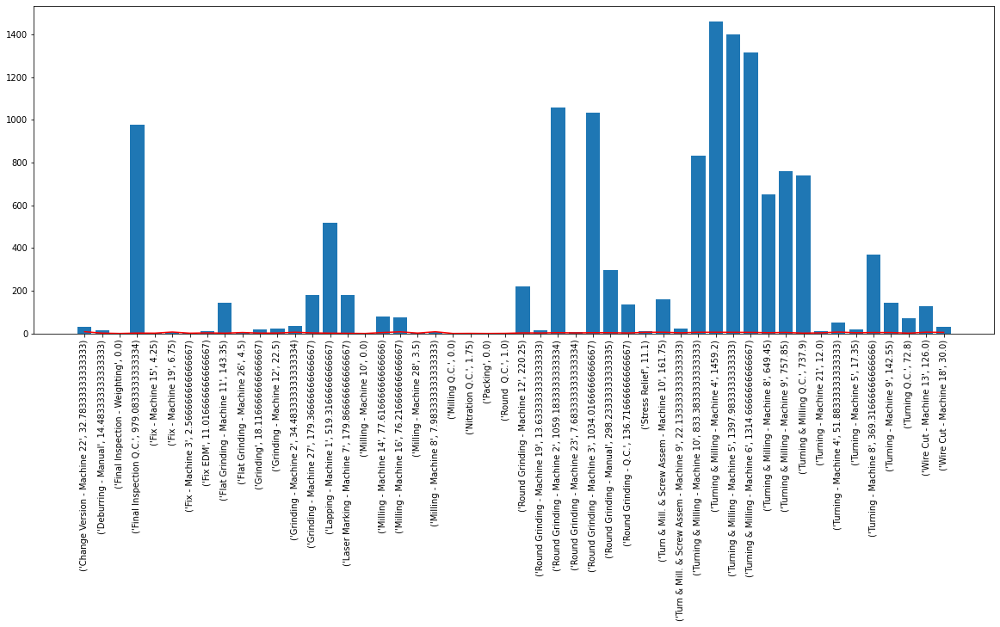

In [ ]:
# 액티비티별 총 시간 및 평균 소요시간 확인

x = np.arange(len(timespan_li))

timespan = []
for i in range(len(timespan_li)):
  timespan.append(timespan_li[i][1])
avg_timespan = []
for j in range(len(timespan)):
  avg_timespan.append(timespan[j]/activity_freq_in_realtime[j])

plt.bar(x, timespan)
plt.plot(x, avg_timespan, color='red')
plt.xticks(x, timespan_li)

plt.rcParams["figure.figsize"] = (20, 7)
plt.xticks(rotation=90)

plt.show()


In [ ]:
activity_li = []
for i in range(len(event_df['concept:name'].value_counts())):
  activity_li.append((event_df['concept:name'].value_counts().index[i], event_df['concept:name'].value_counts()[i]))

# (activity, activity_freq)
activity_li.sort()
activity_li

[('Change Version - Machine 22', 4),
 ('Deburring - Manual', 9),
 ('Final Inspection - Weighting', 1),
 ('Final Inspection Q.C.', 547),
 ('Fix - Machine 15', 3),
 ('Fix - Machine 19', 1),
 ('Fix - Machine 3', 2),
 ('Fix EDM', 4),
 ('Flat Grinding - Machine 11', 111),
 ('Flat Grinding - Machine 26', 1),
 ('Grinding', 11),
 ('Grinding - Machine 12', 11),
 ('Grinding - Machine 2', 6),
 ('Grinding - Machine 27', 69),
 ('Lapping - Machine 1', 367),
 ('Laser Marking - Machine 7', 250),
 ('Milling - Machine 10', 1),
 ('Milling - Machine 14', 18),
 ('Milling - Machine 16', 10),
 ('Milling - Machine 28', 2),
 ('Milling - Machine 8', 1),
 ('Milling Q.C.', 1),
 ('Nitration Q.C.', 4),
 ('Packing', 275),
 ('Round  Q.C.', 2),
 ('Round Grinding - Machine 12', 80),
 ('Round Grinding - Machine 19', 6),
 ('Round Grinding - Machine 2', 267),
 ('Round Grinding - Machine 23', 3),
 ('Round Grinding - Machine 3', 273),
 ('Round Grinding - Manual', 84),
 ('Round Grinding - Q.C.', 59),
 ('Stress Relief', 3),
 

In [ ]:
len(activity_freq)

50

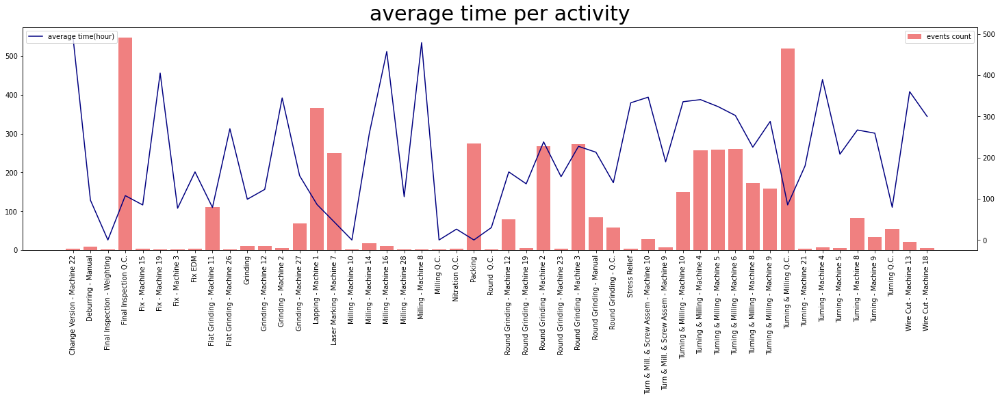

In [ ]:
# 액티비티별 이벤트 개수, 평균 소요시간 확인

x = np.arange(50)

act = []
act_freq = []

for i in range(50):
  act.append(activity_li[i][0])
  act_freq.append(activity_li[i][1])

fig, ax1 = plt.subplots()
plt.xticks(x, act, rotation=90)

ax2 = ax1.twinx()
ax1.bar(x, act_freq, color='lightcoral', label="events count")
ax2.plot(x, avg_timespan, color='navy', label="average time")

ax1.legend(['events count'])
ax2.legend(['average time(hour)'], loc=2)

plt.rcParams["figure.figsize"] = (25, 6)
plt.title('average time per activity',fontsize=30, pad=10)
# plt.tight_layout()
plt.show()

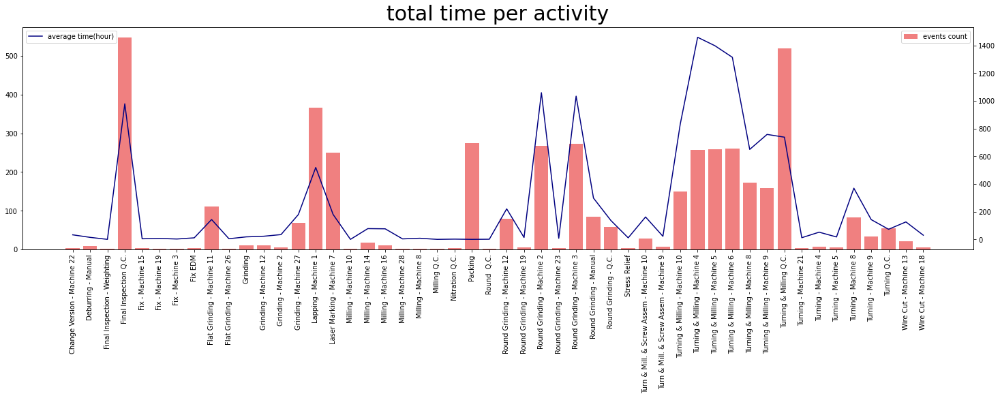

In [ ]:
# 액티비티별 이벤트 개수, 총 소요시간 확인

x = np.arange(50)

act = []
act_freq = []

for i in range(50):
  act.append(activity_li[i][0])
  act_freq.append(activity_li[i][1])

fig, ax1 = plt.subplots()
plt.xticks(x, act, rotation=90)

ax2 = ax1.twinx()
ax1.bar(x, act_freq, color='lightcoral', label="events count")
ax2.plot(x, timespan, color='navy', label="average time")

ax1.legend(['events count'])
ax2.legend(['average time(hour)'], loc=2)

plt.rcParams["figure.figsize"] = (25, 6)
plt.title('total time per activity',fontsize=30, pad=10)
# plt.tight_layout()
plt.show()

### Filtering on case performance

In [ ]:
from pm4py.algo.filtering.log.cases import case_filter as log_case_filter
# 1일에서 10일 사이
# 로그 수준
filtered_log = log_case_filter.filter_case_performance(event_log, 86400, 86400*10)
filtered_log

[{'attributes': {'concept:name': '103'}, 'events': [{'concept:name': 'Turning & Milling - Machine 8', 'time:timestamp': Timestamp('2012-03-06 09:10:00+0000', tz='UTC'), 'time:complete': Timestamp('2012-03-06 10:18:00+0000', tz='UTC'), 'time:span': '001:08', 'resource': 'Machine 8 - Turning & Milling', 'worker_id': 'ID4219', 'qty:order': 52, 'qty:completed': 0, 'qty:rejected': 0, 'qty:mrb': 0, 'component': 'Adjusting Nut', 'report_type': 'B', 'rework': nan, '@@index': 101}, '..', {'concept:name': 'Packing', 'time:timestamp': Timestamp('2012-03-15 00:00:00+0000', tz='UTC'), 'time:complete': Timestamp('2012-03-15 01:00:00+0000', tz='UTC'), 'time:span': '000:00', 'resource': 'Packing', 'worker_id': 'ID4820', 'qty:order': 52, 'qty:completed': 50, 'qty:rejected': 0, 'qty:mrb': 0, 'component': 'Adjusting Nut', 'report_type': 'D', 'rework': nan, '@@index': 119}]}, '....', {'attributes': {'concept:name': '99'}, 'events': [{'concept:name': 'Turning & Milling Q.C.', 'time:timestamp': Timestamp('2

In [ ]:
from pm4py.algo.filtering.pandas.cases import case_filter as df_case_filter
# 데이터프레임 수준

days_li = []
for i in range(100):
  df_cases = df_case_filter.filter_case_performance(event_log_pm4py, min_case_performance=86400*i, max_case_performance=86400*(i+1),
                                                  parameters={df_case_filter.Parameters.CASE_ID_KEY: "case:concept:name",
                                                  df_case_filter.Parameters.TIMESTAMP_KEY: "time:timestamp"})
  days_li.append(len(df_cases))

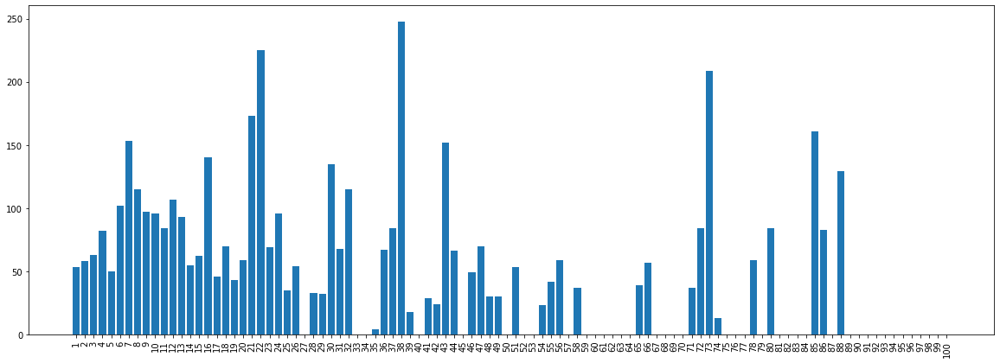

In [ ]:
x = np.arange(100)
days = []
for i in range(100):
  days.append(i+1)
plt.bar(x, days_li)
plt.xticks(x, days)

plt.rcParams["figure.figsize"] = (20,7)
plt.xticks(rotation=90)

plt.show()

### Filtering on start/end activities

In [ ]:
# 로그 수준
from pm4py.algo.filtering.log.end_activities import end_activities_filter as log_end_activities_filter
end_activities = log_end_activities_filter.get_end_activities(event_log)

end_activity_filtered_log_list = []
for i in range(len(list(end_activities))):
  end_activity_filtered_log_list.append(log_end_activities_filter.apply(event_log, list(end_activities)[i]))
end_activity_filtered_log_list

[[{'attributes': {'concept:name': '1'}, 'events': [{'concept:name': 'Turning & Milling - Machine 4', 'time:timestamp': Timestamp('2012-01-29 23:24:00+0000', tz='UTC'), 'time:complete': Timestamp('2012-01-30 05:43:00+0000', tz='UTC'), 'time:span': '006:19', 'resource': 'Machine 4 - Turning & Milling', 'worker_id': 'ID4932', 'qty:order': 10, 'qty:completed': 1, 'qty:rejected': 0, 'qty:mrb': 0, 'component': 'Cable Head', 'report_type': 'S', 'rework': nan, '@@index': 0}, '..', {'concept:name': 'Packing', 'time:timestamp': Timestamp('2012-02-17 00:00:00+0000', tz='UTC'), 'time:complete': Timestamp('2012-02-17 01:00:00+0000', tz='UTC'), 'time:span': '000:00', 'resource': 'Packing', 'worker_id': 'ID4820', 'qty:order': 10, 'qty:completed': 9, 'qty:rejected': 0, 'qty:mrb': 0, 'component': 'Cable Head', 'report_type': 'D', 'rework': nan, '@@index': 15}]}, '....', {'attributes': {'concept:name': '99'}, 'events': [{'concept:name': 'Turning & Milling Q.C.', 'time:timestamp': Timestamp('2012-03-22 1

In [ ]:
len(end_activity_filtered_log_list)

21

In [ ]:
# 데이터프레임 수준
from pm4py.algo.filtering.pandas.start_activities import start_activities_filter as df_start_activities_filter
from pm4py.algo.filtering.pandas.end_activities import end_activities_filter as df_end_activities_filter
start_activities = df_start_activities_filter.get_start_activities(event_log_pm4py)
end_activities = df_end_activities_filter.get_end_activities(event_log_pm4py)

start_activity_filtered_df_list = []
for i in range(len(list(start_activities))):
  start_activity_filtered_df_list.append(df_start_activities_filter.apply(event_log_pm4py, [list(start_activities)[i]],
                                       parameters={df_start_activities_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_start_activities_filter.Parameters.ACTIVITY_KEY: "concept:name"}))

end_activity_filtered_df_list = []
for i in range(len(list(end_activities))):
  end_activity_filtered_df_list.append(df_end_activities_filter.apply(event_log_pm4py, [list(end_activities)[i]],
                                       parameters={df_end_activities_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_end_activities_filter.Parameters.ACTIVITY_KEY: "concept:name"}))

In [ ]:
start_activity_filtered_df_list

[     case:concept:name                   concept:name  ... rework @@index
 174                110  Turning & Milling - Machine 6  ...    NaN     174
 175                110  Turning & Milling - Machine 6  ...    NaN     175
 176                110         Turning & Milling Q.C.  ...    NaN     176
 177                110  Turning & Milling - Machine 6  ...    NaN     177
 178                110  Turning & Milling - Machine 6  ...    NaN     178
 ...                ...                            ...  ...    ...     ...
 4373                92            Lapping - Machine 1  ...    NaN    4373
 4374                92    Round Grinding - Machine 12  ...    NaN    4374
 4375                92          Round Grinding - Q.C.  ...    NaN    4375
 4376                92          Round Grinding - Q.C.  ...    NaN    4376
 4377                92                        Packing  ...    NaN    4377
 
 [704 rows x 15 columns],
      case:concept:name                   concept:name  ... rework @@ind

In [ ]:
len(end_activity_filtered_df_list[0]['case:concept:name'].value_counts())

89

In [ ]:
list(end_activities.keys())[0], list(end_activities.keys())[1], list(end_activities.keys())[2]

('Final Inspection Q.C.', 'Packing', 'Turning & Milling Q.C.')

In [ ]:
end_activity_filtered_df_list[0].tail(1), end_activity_filtered_df_list[1].tail(1), end_activity_filtered_df_list[2].tail(1)

(     case:concept:name           concept:name  ... rework @@index
 4499                97  Final Inspection Q.C.  ...    NaN    4499
 
 [1 rows x 15 columns],      case:concept:name concept:name  ... rework @@index
 4512                99      Packing  ...    NaN    4512
 
 [1 rows x 15 columns],      case:concept:name            concept:name  ... rework @@index
 4216                86  Turning & Milling Q.C.  ...    NaN    4216
 
 [1 rows x 15 columns])

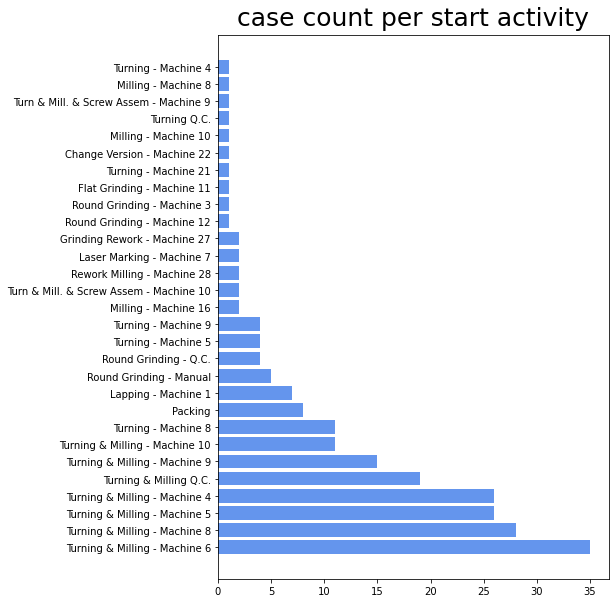

In [ ]:
# 원본 데이터
# 시작 액티비티 별 케이스 개수
y = np.arange(len(start_activities))

start_freq = []
for i in range(len(start_activities)):
  start_freq.append(len(start_activity_filtered_df_list[i]['case:concept:name'].value_counts()))
plt.barh(y, start_freq, color='cornflowerblue')
plt.yticks(y, list(start_activities.keys()))

plt.rcParams["figure.figsize"] = (7,10)
# plt.xticks(rotation=90)
# plt.legend()
plt.title('case count per start activity',fontsize=25, pad=10)

plt.show()

In [ ]:
# 유지할 start activity list
remain_start_act_li = list(start_activities.keys())[0:19]

In [ ]:
start_freq

[35,
 28,
 26,
 26,
 19,
 15,
 11,
 11,
 8,
 7,
 5,
 4,
 4,
 4,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1]

In [ ]:
# start activity로 한번만 나타난 데이터 제거 (case 10개 감소)
start_activity_filtered_df_list = []
for i in range(len(remain_start_act_li)):
  start_activity_filtered_df_list.append(df_start_activities_filter.apply(event_df, [remain_start_act_li[i]],
                                       parameters={df_start_activities_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_start_activities_filter.Parameters.ACTIVITY_KEY: "concept:name"}))

In [ ]:
len(event_df), len(result)

(4513, 4362)

In [ ]:
result = event_df[event_df['concept:name'] == 'SETUP     Turning & Milling - Machine 5']
for i in range(len(start_activity_filtered_df_list)):
  result = pd.concat([result,start_activity_filtered_df_list[i]])
result

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
174,110,Turning & Milling - Machine 6,2012-03-01 03:49:00+00:00,2012-03-01 06:35:00+00:00,002:46,Machine 6 - Turning & Milling,ID4794,500,1,0,0,Ballnut,S,NaN,174
175,110,Turning & Milling - Machine 6,2012-03-01 06:57:00+00:00,2012-03-01 12:36:00+00:00,005:39,Machine 6 - Turning & Milling,ID4529,500,3,0,0,Ballnut,S,NaN,175
176,110,Turning & Milling Q.C.,2012-03-01 10:00:00+00:00,2012-03-01 11:00:00+00:00,001:00,Quality Check 1,ID4163,500,0,0,0,Ballnut,D,NaN,176
177,110,Turning & Milling - Machine 6,2012-03-01 12:37:00+00:00,2012-03-01 15:46:00+00:00,003:09,Machine 6 - Turning & Milling,ID4529,500,10,0,0,Ballnut,D,NaN,177
178,110,Turning & Milling - Machine 6,2012-03-01 20:16:00+00:00,2012-03-02 06:27:00+00:00,010:11,Machine 6 - Turning & Milling,ID4794,500,30,0,0,Ballnut,D,NaN,178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1801,225,Grinding Rework - Machine 27,2012-03-21 16:13:00+00:00,2012-03-21 16:48:00+00:00,000:35,Machine 27 - Grinding,ID4872,185,0,0,0,Cable Head,D,NaN,1801
1802,225,Packing,2012-03-22 00:00:00+00:00,2012-03-22 01:00:00+00:00,000:00,Packing,ID4820,185,9,0,0,Cable Head,D,NaN,1802
1803,225,Final Inspection Q.C.,2012-03-22 07:00:00+00:00,2012-03-22 07:30:00+00:00,000:30,Quality Check 1,ID4163,185,9,0,0,Cable Head,D,NaN,1803
1804,225,Grinding Rework - Machine 27,2012-03-26 15:59:00+00:00,2012-03-26 18:06:00+00:00,002:07,Machine 27 - Grinding,ID4528,185,0,0,0,Cable Head,D,NaN,1804


In [ ]:
result.to_csv('/content/drive/MyDrive/데스팀플/data/start_activity_deleted_data.csv', encoding='utf-8')

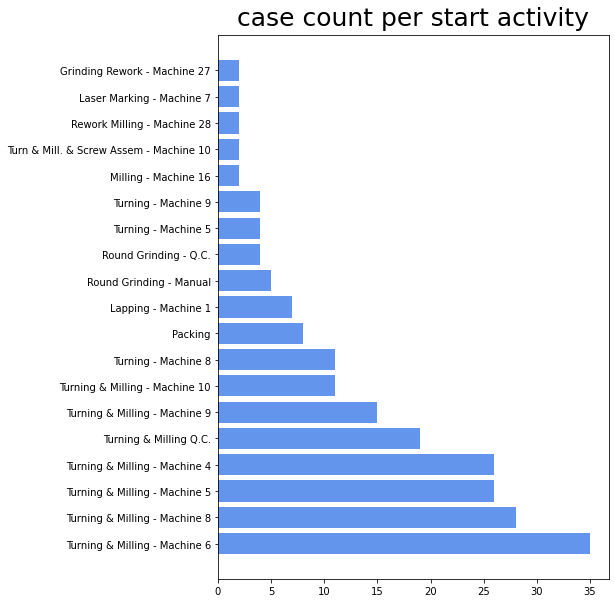

In [ ]:
# 시작 액티비티 별 케이스 개수
y = np.arange(len(remain_start_act_li))

start_freq = []
for i in range(len(remain_start_act_li)):
  start_freq.append(len(start_activity_filtered_df_list[i]['case:concept:name'].value_counts()))
plt.barh(y, start_freq, color='cornflowerblue')
plt.yticks(y, remain_start_act_li)

plt.rcParams["figure.figsize"] = (7,10)
# plt.xticks(rotation=90)
# plt.legend()
plt.title('case count per start activity',fontsize=25, pad=10)

plt.show()

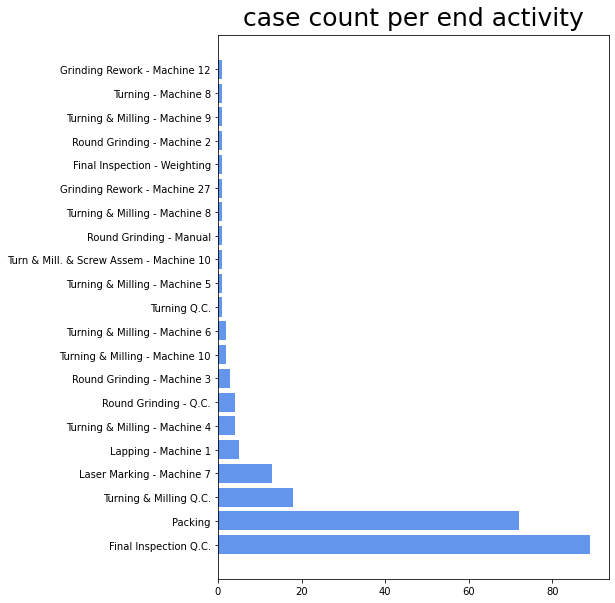

In [ ]:
# 종료 액티비티 별 케이스 개수
y = np.arange(len(end_activities))

end_freq = []
for i in range(len(end_activities)):
  end_freq.append(len(end_activity_filtered_df_list[i]['case:concept:name'].value_counts()))
plt.barh(y, end_freq, color='cornflowerblue')
plt.yticks(y, list(end_activities.keys()))

plt.rcParams["figure.figsize"] = (7,10)
# plt.xticks(rotation=90)
# plt.legend()
plt.title('case count per end activity',fontsize=25, pad=10)


plt.show()

In [ ]:
# 유지할 end activity list
remain_end_act_li = list(end_activities.keys())[0:10]

In [ ]:
end_freq

[89, 72, 18, 13, 5, 4, 4, 3, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [ ]:
end_activity_filtered_df_list = []
for i in range(len(remain_end_act_li)):
  end_activity_filtered_df_list.append(df_end_activities_filter.apply(result, [remain_end_act_li[i]],
                                       parameters={df_end_activities_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_end_activities_filter.Parameters.ACTIVITY_KEY: "concept:name"}))

In [ ]:
result2 = event_df[event_df['concept:name'] == 'SETUP     Turning & Milling - Machine 5']
for i in range(len(end_activity_filtered_df_list)):
  result2 = pd.concat([result2,end_activity_filtered_df_list[i]])
result2

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
174,110,Turning & Milling - Machine 6,2012-03-01 03:49:00+00:00,2012-03-01 06:35:00+00:00,002:46,Machine 6 - Turning & Milling,ID4794,500,1,0,0,Ballnut,S,NaN,174
175,110,Turning & Milling - Machine 6,2012-03-01 06:57:00+00:00,2012-03-01 12:36:00+00:00,005:39,Machine 6 - Turning & Milling,ID4529,500,3,0,0,Ballnut,S,NaN,175
176,110,Turning & Milling Q.C.,2012-03-01 10:00:00+00:00,2012-03-01 11:00:00+00:00,001:00,Quality Check 1,ID4163,500,0,0,0,Ballnut,D,NaN,176
177,110,Turning & Milling - Machine 6,2012-03-01 12:37:00+00:00,2012-03-01 15:46:00+00:00,003:09,Machine 6 - Turning & Milling,ID4529,500,10,0,0,Ballnut,D,NaN,177
178,110,Turning & Milling - Machine 6,2012-03-01 20:16:00+00:00,2012-03-02 06:27:00+00:00,010:11,Machine 6 - Turning & Milling,ID4794,500,30,0,0,Ballnut,D,NaN,178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486,125,Turning & Milling - Machine 6,2012-03-29 07:26:00+00:00,2012-03-29 13:22:00+00:00,005:56,Machine 6 - Turning & Milling,ID4167,48,1,0,0,Ballnut,S,NaN,486
487,125,Turning & Milling Q.C.,2012-03-29 13:25:00+00:00,2012-03-29 16:03:00+00:00,002:38,Quality Check 1,ID4618,48,0,0,0,Ballnut,D,NaN,487
488,125,Turning & Milling - Machine 6,2012-03-29 15:43:00+00:00,2012-03-29 15:58:00+00:00,000:15,Machine 6 - Turning & Milling,ID4167,48,6,0,0,Ballnut,D,NaN,488
489,125,Turning & Milling - Machine 6,2012-03-29 16:45:00+00:00,2012-03-29 17:29:00+00:00,000:44,Machine 6 - Turning & Milling,ID4429,48,5,0,0,Ballnut,D,NaN,489


In [ ]:
len(event_df), len(result), len(result2)

(4513, 4362, 4122)

In [ ]:
result2.to_csv('/content/drive/MyDrive/데스팀플/data/start_end_activity_deleted_data.csv', encoding='utf-8')

### Filtering on attributes values

In [ ]:
# 로그 수준
from pm4py.algo.filtering.log.attributes import attributes_filter as log_attributes_filter
activities = log_attributes_filter.get_attribute_values(event_log, "concept:name")
resources = log_attributes_filter.get_attribute_values(event_log, "resource")
print(resources)

# 주어진 리소스 목록을 포함하는 trace 필터링
tracefilter_log_pos = log_attributes_filter.apply(event_log, ["Machine 4 - Turning & Milling"],
                                              parameters={log_attributes_filter.Parameters.ATTRIBUTE_KEY: "resource", log_attributes_filter.Parameters.POSITIVE: True})
# 주어진 리소스 목록을 포함하지 않는 trace 필터링
tracefilter_log_neg = log_attributes_filter.apply(event_log, ["Machine 4 - Turning & Milling"],
                                              parameters={log_attributes_filter.Parameters.ATTRIBUTE_KEY: "resource", log_attributes_filter.Parameters.POSITIVE: False})

# 주어진 리소스 목록에서 수행한 이벤트만 유지하는 것도 가능합니다(케이스 트리밍)
tracefilter_log_pos = log_attributes_filter.apply_events(event_log, ["Machine 4 - Turning & Milling"],
                                                     parameters={log_attributes_filter.Parameters.ATTRIBUTE_KEY: "resource", log_attributes_filter.Parameters.POSITIVE: True})
tracefilter_log_neg = log_attributes_filter.apply_events(event_log, ["Machine 4 - Turning & Milling"],
                                                     parameters={log_attributes_filter.Parameters.ATTRIBUTE_KEY: "resource", log_attributes_filter.Parameters.POSITIVE: False})

# 이벤트 속성에 필터를 자동으로 적용하기 위해(트레이스를 트리밍하고 값이 빈번한 속성을 포함하는 이벤트만 유지) apply_auto_filter 메소드가 제공됩니다.
# 메서드는 속성 이름과 DECREASING_FACTOR(기본값 0.6, 시작 활동 필터에서 설명을 찾을 수 있음) 매개변수로 허용합니다.
filtered_log = log_attributes_filter.apply_auto_filter(event_log,
                                                   parameters={log_attributes_filter.Parameters.ATTRIBUTE_KEY: "concept:name", log_attributes_filter.Parameters.DECREASING_FACTOR: 0.6})

{'Machine 4 - Turning & Milling': 271, 'Quality Check 1': 1193, 'Machine 7- Laser Marking': 252, 'Machine 1 - Lapping': 369, 'Machine 3 - Round Grinding': 275, 'Packing': 277, 'Machine 9 - Turning & Milling': 198, 'Machine 11 - Grinding': 124, 'Machine 8 - Turning & Milling': 219, 'Machine 12 - Grinding': 93, 'Machine 27 - Grinding': 153, 'Machine 5 - Turning & Milling': 264, 'Machine 10 - Grinding': 178, 'Machine 2 - Round Grinding': 273, 'Machine 6 - Turning & Milling': 261, 'Manual Deburring': 9, 'Wire Cut - Machine 13': 21, 'Machine 18 - Wire Cutting': 6, 'Manual Milling - Machine 28': 2, 'Machine 17 - Sinking': 4, 'Machine 14 - Milling': 18, 'Machine 26 - Flat Grinding': 1, 'Machine 15 - Turning': 49, 'Machine 25 - Grinding': 1, 'Quality Check 2': 2, 'Oven': 3, 'Machine 21 - Turning': 4, 'Machine 16 - Milling': 10, 'Machine 22 - Milling': 4, 'Machine 19 - Grinding': 6, 'Machine 23 - Turning': 3}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: DeprecatedWarning: apply_auto_filter is deprecated as of 2.2.11 and will be removed in 3.0.0. Removed


In [ ]:
# 이벤트 수준
from pm4py.algo.filtering.pandas.attributes import attributes_filter as df_attributes_filter
activities = df_attributes_filter.get_attribute_values(event_log_pm4py, attribute_key="concept:name")
resources = df_attributes_filter.get_attribute_values(event_log_pm4py, attribute_key="resource")

# 주어진 리소스 목록을 포함하는 trace 필터링
df_traces_pos = df_attributes_filter.apply(event_log_pm4py, ["Machine 4 - Turning & Milling"],
                                          parameters={df_attributes_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_attributes_filter.Parameters.ATTRIBUTE_KEY: "resource", df_attributes_filter.Parameters.POSITIVE: True})
df_traces_pos

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
0,1,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN,0
1,1,Turning & Milling - Machine 4,2012-01-30 05:44:00+00:00,2012-01-30 06:42:00+00:00,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN,1
2,1,Turning & Milling - Machine 4,2012-01-30 06:59:00+00:00,2012-01-30 07:21:00+00:00,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN,2
3,1,Turning & Milling - Machine 4,2012-01-30 07:21:00+00:00,2012-01-30 10:58:00+00:00,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN,3
4,1,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4504,95,Round Grinding - Machine 3,2012-03-28 03:54:00+00:00,2012-03-28 05:45:00+00:00,001:51,Machine 3 - Round Grinding,ID0420,305,0,0,0,Punch Holder,D,NaN,4504
4505,95,Final Inspection Q.C.,2012-03-28 07:47:00+00:00,2012-03-28 10:36:00+00:00,002:49,Quality Check 1,ID4618,305,136,0,0,Punch Holder,D,NaN,4505
4506,95,Final Inspection Q.C.,2012-03-28 10:37:00+00:00,2012-03-28 11:49:00+00:00,001:12,Quality Check 1,ID4618,305,0,8,0,Punch Holder,D,NaN,4506
4507,95,Final Inspection Q.C.,2012-03-28 12:38:00+00:00,2012-03-28 12:39:00+00:00,000:01,Quality Check 1,ID4618,305,43,0,0,Punch Holder,D,NaN,4507


In [ ]:
# 주어진 리소스 목록을 포함하지 않는 trace 필터링
df_traces_neg = df_attributes_filter.apply(event_log_pm4py, ["Machine 4 - Turning & Milling"],
                                          parameters={df_attributes_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_attributes_filter.Parameters.ATTRIBUTE_KEY: "resource", df_attributes_filter.Parameters.POSITIVE: False})
df_traces_neg

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
16,10,Turning & Milling - Machine 9,2012-01-17 07:01:00+00:00,2012-01-17 11:05:00+00:00,004:04,Machine 9 - Turning & Milling,ID3846,251,1,0,0,Spur Gear,S,NaN,16
17,10,Turning Q.C.,2012-01-17 11:00:00+00:00,2012-01-17 11:15:00+00:00,000:15,Quality Check 1,ID4618,251,0,0,0,Spur Gear,D,NaN,17
18,10,Turning & Milling - Machine 9,2012-01-17 19:24:00+00:00,2012-01-17 20:01:00+00:00,000:37,Machine 9 - Turning & Milling,ID4132,251,0,0,0,Spur Gear,S,NaN,18
19,10,Turning & Milling - Machine 9,2012-01-17 20:01:00+00:00,2012-01-17 23:43:00+00:00,003:42,Machine 9 - Turning & Milling,ID4132,251,17,0,0,Spur Gear,D,NaN,19
20,10,Turning & Milling - Machine 9,2012-01-17 23:49:00+00:00,2012-01-18 06:32:00+00:00,006:43,Machine 9 - Turning & Milling,ID4794,251,37,0,0,Spur Gear,D,NaN,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4538,99,Laser Marking - Machine 7,2012-03-26 09:14:00+00:00,2012-03-26 10:12:00+00:00,000:58,Machine 7- Laser Marking,ID0998,507,160,0,0,Drill,D,NaN,4538
4539,99,Lapping - Machine 1,2012-03-26 10:12:00+00:00,2012-03-26 12:12:00+00:00,002:00,Machine 1 - Lapping,ID0998,507,160,0,0,Drill,D,NaN,4539
4540,99,Final Inspection Q.C.,2012-03-28 17:35:00+00:00,2012-03-28 17:59:00+00:00,000:24,Quality Check 1,ID4618,507,0,0,0,Drill,D,NaN,4540
4541,99,Final Inspection Q.C.,2012-03-29 08:00:00+00:00,2012-03-29 11:54:00+00:00,003:54,Quality Check 1,ID4618,507,160,0,0,Drill,D,NaN,4541


In [ ]:
# 주어진 리소스 목록에서 수행한 이벤트만 유지하는 것도 가능합니다(케이스 트리밍)
df_traces_pos = df_attributes_filter.apply_events(event_log_pm4py, ["Machine 4 - Turning & Milling"],
                                          parameters={df_attributes_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_attributes_filter.Parameters.ATTRIBUTE_KEY: "resource", df_attributes_filter.Parameters.POSITIVE: True})
df_traces_pos

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
0,1,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN,0
1,1,Turning & Milling - Machine 4,2012-01-30 05:44:00+00:00,2012-01-30 06:42:00+00:00,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN,1
2,1,Turning & Milling - Machine 4,2012-01-30 06:59:00+00:00,2012-01-30 07:21:00+00:00,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN,2
3,1,Turning & Milling - Machine 4,2012-01-30 07:21:00+00:00,2012-01-30 10:58:00+00:00,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN,3
126,105,Turning & Milling - Machine 4,2012-03-20 23:18:00+00:00,2012-03-21 06:34:00+00:00,007:16,Machine 4 - Turning & Milling,ID4167,15,0,0,0,Bearing,S,NaN,126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4463,95,Turning & Milling - Machine 4,2012-03-02 06:44:00+00:00,2012-03-02 12:45:00+00:00,006:01,Machine 4 - Turning & Milling,ID4167,305,14,0,0,Punch Holder,D,NaN,4463
4464,95,Turning & Milling - Machine 4,2012-03-03 12:57:00+00:00,2012-03-03 19:57:00+00:00,007:00,Machine 4 - Turning & Milling,ID4529,305,16,0,0,Punch Holder,D,NaN,4464
4465,95,Turning & Milling - Machine 4,2012-03-03 22:23:00+00:00,2012-03-04 06:47:00+00:00,008:24,Machine 4 - Turning & Milling,ID4641,305,28,0,0,Punch Holder,D,NaN,4465
4466,95,Turning & Milling - Machine 4,2012-03-04 06:56:00+00:00,2012-03-04 11:11:00+00:00,004:15,Machine 4 - Turning & Milling,ID4932,305,53,0,0,Punch Holder,D,NaN,4466


In [ ]:
df_traces_neg = df_attributes_filter.apply_events(event_log_pm4py, ["Machine 4 - Turning & Milling"],
                                          parameters={df_attributes_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_attributes_filter.Parameters.ATTRIBUTE_KEY: "resource", df_attributes_filter.Parameters.POSITIVE: False})
df_traces_neg

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
4,1,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN,4
5,1,Laser Marking - Machine 7,2012-02-01 08:18:00+00:00,2012-02-01 08:27:00+00:00,000:09,Machine 7- Laser Marking,ID0998,10,9,0,0,Cable Head,D,NaN,5
6,1,Lapping - Machine 1,2012-02-14 00:00:00+00:00,2012-02-14 01:15:00+00:00,000:00,Machine 1 - Lapping,ID4882,10,0,0,0,Cable Head,D,NaN,6
7,1,Lapping - Machine 1,2012-02-14 00:00:00+00:00,2012-02-14 01:15:00+00:00,000:00,Machine 1 - Lapping,ID4882,10,0,0,0,Cable Head,D,NaN,7
8,1,Lapping - Machine 1,2012-02-14 09:05:00+00:00,2012-02-14 10:20:00+00:00,000:00,Machine 1 - Lapping,ID4882,10,1,0,0,Cable Head,D,NaN,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4538,99,Laser Marking - Machine 7,2012-03-26 09:14:00+00:00,2012-03-26 10:12:00+00:00,000:58,Machine 7- Laser Marking,ID0998,507,160,0,0,Drill,D,NaN,4538
4539,99,Lapping - Machine 1,2012-03-26 10:12:00+00:00,2012-03-26 12:12:00+00:00,002:00,Machine 1 - Lapping,ID0998,507,160,0,0,Drill,D,NaN,4539
4540,99,Final Inspection Q.C.,2012-03-28 17:35:00+00:00,2012-03-28 17:59:00+00:00,000:24,Quality Check 1,ID4618,507,0,0,0,Drill,D,NaN,4540
4541,99,Final Inspection Q.C.,2012-03-29 08:00:00+00:00,2012-03-29 11:54:00+00:00,003:54,Quality Check 1,ID4618,507,160,0,0,Drill,D,NaN,4541


In [ ]:
# 이벤트 속성에 필터를 자동으로 적용하기 위해(트레이스를 트리밍하고 값이 빈번한 속성을 포함하는 이벤트만 유지) apply_auto_filter 메소드가 제공됩니다.
# 메서드는 속성 이름과 DECREASING_FACTOR(기본값 0.6, 시작 활동 필터에서 설명을 찾을 수 있음) 매개변수로 허용합니다.
filtered_df = df_attributes_filter.apply_auto_filter(event_log_pm4py,
                                                     parameters={df_attributes_filter.Parameters.CASE_ID_KEY: "case:concept:name", df_attributes_filter.Parameters.ATTRIBUTE_KEY: "concept:name", df_attributes_filter.Parameters.DECREASING_FACTOR: 0.6})
filtered_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecatedWarning: apply_auto_filter is deprecated as of 2.2.11 and will be removed in 3.0.0. Removed
  after removing the cwd from sys.path.


,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework,@@index
0,1,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN,0
1,1,Turning & Milling - Machine 4,2012-01-30 05:44:00+00:00,2012-01-30 06:42:00+00:00,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN,1
2,1,Turning & Milling - Machine 4,2012-01-30 06:59:00+00:00,2012-01-30 07:21:00+00:00,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN,2
3,1,Turning & Milling - Machine 4,2012-01-30 07:21:00+00:00,2012-01-30 10:58:00+00:00,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN,3
4,1,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4538,99,Laser Marking - Machine 7,2012-03-26 09:14:00+00:00,2012-03-26 10:12:00+00:00,000:58,Machine 7- Laser Marking,ID0998,507,160,0,0,Drill,D,NaN,4538
4539,99,Lapping - Machine 1,2012-03-26 10:12:00+00:00,2012-03-26 12:12:00+00:00,002:00,Machine 1 - Lapping,ID0998,507,160,0,0,Drill,D,NaN,4539
4540,99,Final Inspection Q.C.,2012-03-28 17:35:00+00:00,2012-03-28 17:59:00+00:00,000:24,Quality Check 1,ID4618,507,0,0,0,Drill,D,NaN,4540
4541,99,Final Inspection Q.C.,2012-03-29 08:00:00+00:00,2012-03-29 11:54:00+00:00,003:54,Quality Check 1,ID4618,507,160,0,0,Drill,D,NaN,4541


In [ ]:
len(filtered_df['case:concept:name'].value_counts()), len(event_log_pm4py['case:concept:name'].value_counts())

(225, 225)

### Between Filter

In [ ]:
# 현재 케이스 세트에서 시작 activity에서 대상 activity로 이동하는 모든 하위 case를 식별하여 이벤트 로그를 변환
# filtered_log = pm4py.filter_between(log, "check ticket", "decide")

filtered_log = pm4py.filter_between(event_log, "Turning & Milling - Machine 4", "Final Inspection Q.C.")

columns=list(dict(filtered_log[0][0]))
columns.append('case:concept:name')
filtered_df = pd.DataFrame(columns=columns)

id_list = []
id_dicli = []
for k in range(len(event_log)):
  id_list.append(int(event_log[k].attributes['concept:name']))
  id_dicli.append({'case:concept:name': id_list[k]})

for j in range(len(filtered_log)):
  for i in range(len(filtered_log[j])):
    dic = dict(filtered_log[j][i], **id_dicli[j])
    filtered_df = filtered_df.append(dic, ignore_index=True)

filtered_df = filtered_df[['case:concept:name', 'concept:name', 'time:timestamp', 'time:complete', 'time:span',
             'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb',
             'component', 'report_type', 'rework']]

# print('len(filtered_df):', len(filtered_df))
filtered_df.head(5)

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework
0,1,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN
1,1,Turning & Milling - Machine 4,2012-01-30 05:44:00+00:00,2012-01-30 06:42:00+00:00,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN
2,1,Turning & Milling - Machine 4,2012-01-30 06:59:00+00:00,2012-01-30 07:21:00+00:00,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN
3,1,Turning & Milling - Machine 4,2012-01-30 07:21:00+00:00,2012-01-30 10:58:00+00:00,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN
4,1,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635,95,Round Grinding - Machine 3,2012-03-25 23:45:00+00:00,2012-03-26 06:40:00+00:00,006:55,Machine 3 - Round Grinding,ID0420,305,43,0,0,Punch Holder,D,NaN
636,95,Round Grinding - Machine 3,2012-03-26 07:00:00+00:00,2012-03-26 17:43:00+00:00,010:43,Machine 3 - Round Grinding,ID4445,305,45,0,0,Punch Holder,D,NaN
637,95,Round Grinding - Machine 3,2012-03-26 20:19:00+00:00,2012-03-27 06:44:00+00:00,010:25,Machine 3 - Round Grinding,ID0420,305,61,0,0,Punch Holder,D,NaN
638,95,Round Grinding - Machine 3,2012-03-27 07:10:00+00:00,2012-03-27 16:00:00+00:00,008:50,Machine 3 - Round Grinding,ID4445,305,34,0,0,Punch Holder,D,NaN


In [ ]:
dict(filtered_log[0][0]).keys(), dict(filtered_log[0][0]).values(), dict(filtered_log[0][0]), len(filtered_log[0]), len(filtered_log[1])

(dict_keys(['concept:name', 'time:timestamp', 'time:complete', 'time:span', 'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb', 'component', 'report_type', 'rework', '@@index', 'case:concept:name']),
 dict_values(['Turning & Milling - Machine 4', Timestamp('2012-01-29 23:24:00+0000', tz='UTC'), Timestamp('2012-01-30 05:43:00+0000', tz='UTC'), '006:19', 'Machine 4 - Turning & Milling', 'ID4932', 10, 1, 0, 0, 'Cable Head', 'S', nan, 0, '1']),
 {'@@index': 0,
  'case:concept:name': '1',
  'component': 'Cable Head',
  'concept:name': 'Turning & Milling - Machine 4',
  'qty:completed': 1,
  'qty:mrb': 0,
  'qty:order': 10,
  'qty:rejected': 0,
  'report_type': 'S',
  'resource': 'Machine 4 - Turning & Milling',
  'rework': nan,
  'time:complete': Timestamp('2012-01-30 05:43:00+0000', tz='UTC'),
  'time:span': '006:19',
  'time:timestamp': Timestamp('2012-01-29 23:24:00+0000', tz='UTC'),
  'worker_id': 'ID4932'},
 13,
 15)

### Case Size Filter

In [ ]:
# 너무 짧거나(분명히 불완전하거나 이상값인 경우) 너무 긴 case(너무 많은 재작업)를 제거

# trace 길이가 10~30 사이인 case
filtered_log = pm4py.filter_case_size(event_log, 5, 100)

columns=list(dict(filtered_log[0][0]))
columns.append('case:concept:name')
filtered_df = pd.DataFrame(columns=columns)

id_list = []
id_dicli = []
for k in range(len(event_log)):
  id_list.append(int(event_log[k].attributes['concept:name']))
  id_dicli.append({'case:concept:name': id_list[k]})

for j in range(len(filtered_log)):
  for i in range(len(filtered_log[j])):
    dic = dict(filtered_log[j][i], **id_dicli[j])
    filtered_df = filtered_df.append(dic, ignore_index=True)

filtered_df = filtered_df[['case:concept:name', 'concept:name', 'time:timestamp', 'time:complete', 'time:span',
             'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb',
             'component', 'report_type', 'rework']]

# print('len(filtered_df):', len(filtered_df))
filtered_df.head(5)


,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework
0,1,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN
1,1,Turning & Milling - Machine 4,2012-01-30 05:44:00+00:00,2012-01-30 06:42:00+00:00,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN
2,1,Turning & Milling - Machine 4,2012-01-30 06:59:00+00:00,2012-01-30 07:21:00+00:00,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN
3,1,Turning & Milling - Machine 4,2012-01-30 07:21:00+00:00,2012-01-30 10:58:00+00:00,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN
4,1,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN


In [ ]:
filtered_df['case:concept:name'].value_counts()

42     30
102    30
201    30
242    29
21     29
       ..
72     10
261    10
246    10
4      10
124    10
Name: case:concept:name, Length: 124, dtype: int64

In [ ]:
dict(filtered_log[0][0]).keys()

dict_keys(['Unnamed: 0', 'concept:name', 'time:timestamp', 'time:complete', 'time:span', 'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb', 'component', 'report_type', 'rework', '@@index'])

In [ ]:

dict(event_log[0][0]).keys()

dict_keys(['Unnamed: 0', 'concept:name', 'time:timestamp', 'time:complete', 'time:span', 'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb', 'component', 'report_type', 'rework', '@@index'])

### Rework Filter

In [ ]:
# 주어진 activity가 반복되는 case를 필터링

# Turning & Milling - Machine 4 activity가 10회 이상 rework된 case
filtered_log = pm4py.filter_activities_rework(event_log, "Turning & Milling - Machine 4", 10)

columns=list(dict(filtered_log[0][0]))
columns.append('case:concept:name')
filtered_df = pd.DataFrame(columns=columns)

id_list = []
id_dicli = []
for k in range(len(event_log)):
  id_list.append(int(event_log[k].attributes['concept:name']))
  id_dicli.append({'case:concept:name': id_list[k]})

for j in range(len(filtered_log)):
  for i in range(len(filtered_log[j])):
    dic = dict(filtered_log[j][i], **id_dicli[j])
    filtered_df = filtered_df.append(dic, ignore_index=True)

filtered_df = filtered_df[['case:concept:name', 'concept:name', 'time:timestamp', 'time:complete', 'time:span',
             'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb',
             'component', 'report_type', 'rework']]

# print('len(filtered_df):', len(filtered_df))
filtered_df.head(5)

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework
0,1,Turning & Milling - Machine 4,2012-03-14 00:00:00+00:00,2012-03-14 01:15:00+00:00,000:00,Machine 4 - Turning & Milling,ID4429,80,0,0,0,Cable Head,S,NaN
1,1,Turning & Milling - Machine 4,2012-03-14 23:30:00+00:00,2012-03-15 02:00:00+00:00,002:30,Machine 4 - Turning & Milling,ID4932,80,0,0,0,Cable Head,S,NaN
2,1,Turning & Milling - Machine 4,2012-03-15 02:00:00+00:00,2012-03-15 06:30:00+00:00,004:30,Machine 4 - Turning & Milling,ID4932,80,32,0,0,Cable Head,D,NaN
3,1,Turning & Milling - Machine 4,2012-03-15 07:31:00+00:00,2012-03-15 08:51:00+00:00,001:20,Machine 4 - Turning & Milling,ID4167,80,0,0,0,Cable Head,D,NaN
4,1,Turning & Milling - Machine 4,2012-03-15 10:39:00+00:00,2012-03-15 17:56:00+00:00,007:17,Machine 4 - Turning & Milling,ID4167,80,34,0,0,Cable Head,D,NaN


In [ ]:
filtered_df[filtered_df['case:concept:name']==10]

,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework
19,10,Turning & Milling - Machine 5,2012-01-18 03:51:00+00:00,2012-01-18 05:31:00+00:00,001:40,Machine 5 - Turning & Milling,ID4932,557,2,0,0,Cable Head,S,NaN
20,10,Turning & Milling - Machine 5,2012-01-18 05:32:00+00:00,2012-01-18 06:39:00+00:00,001:07,Machine 5 - Turning & Milling,ID4932,557,8,0,0,Cable Head,D,NaN
21,10,Turning & Milling - Machine 5,2012-01-18 07:01:00+00:00,2012-01-18 08:44:00+00:00,001:43,Machine 5 - Turning & Milling,ID4429,557,0,0,0,Cable Head,B,NaN
22,10,Turning & Milling - Machine 5,2012-01-18 19:56:00+00:00,2012-01-18 20:12:00+00:00,000:16,Machine 5 - Turning & Milling,ID4932,557,0,0,0,Cable Head,S,NaN
23,10,Turning & Milling - Machine 5,2012-01-18 20:12:00+00:00,2012-01-19 06:46:00+00:00,010:34,Machine 5 - Turning & Milling,ID4932,557,80,0,0,Cable Head,D,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,10,Grinding Rework - Machine 12,2012-03-27 14:20:00+00:00,2012-03-27 15:50:00+00:00,001:30,Machine 12 - Grinding,ID4872,557,0,0,0,Cable Head,D,NaN
190,10,Packing,2012-03-28 00:00:00+00:00,2012-03-28 01:00:00+00:00,000:00,Packing,ID4820,557,130,0,0,Cable Head,D,NaN
191,10,Final Inspection Q.C.,2012-03-29 17:00:00+00:00,2012-03-29 18:05:00+00:00,001:05,Quality Check 1,ID4163,557,0,0,0,Cable Head,D,NaN
192,10,Packing,2012-03-30 00:00:00+00:00,2012-03-30 01:00:00+00:00,000:00,Packing,ID4491,557,15,0,0,Cable Head,D,NaN


In [ ]:
filtered_df['case:concept:name'].value_counts()

10     175
103     89
101     86
104     58
100     35
102     23
1       19
Name: case:concept:name, dtype: int64

### Paths Performance Filter

In [ ]:
# 두 activity 사이의 주어진 경로가 사용자가 지정한 범위에 포함된 기간을 갖는 case를 필터링

# 'Turning & Milling - Machine 4'에서 'Final Inspection Q.C.'까지 0초~0초 사이의 시간이 걸린 case
filtered_log = pm4py.filter_paths_performance(event_log, ("Lapping - Machine 1", "Lapping - Machine 1"), 0, 0)


columns=list(dict(filtered_log[0][0]))
columns.append('case:concept:name')
filtered_df = pd.DataFrame(columns=columns)

id_list = []
id_dicli = []
for k in range(len(event_log)):
  id_list.append(int(event_log[k].attributes['concept:name']))
  id_dicli.append({'case:concept:name': id_list[k]})

for j in range(len(filtered_log)):
  for i in range(len(filtered_log[j])):
    dic = dict(filtered_log[j][i], **id_dicli[j])
    filtered_df = filtered_df.append(dic, ignore_index=True)

filtered_df = filtered_df[['case:concept:name', 'concept:name', 'time:timestamp', 'time:complete', 'time:span',
             'resource', 'worker_id', 'qty:order', 'qty:completed', 'qty:rejected', 'qty:mrb',
             'component', 'report_type', 'rework']]

# print('len(filtered_df):', len(filtered_df))
filtered_df.head(5)

len(filtered_df): 740


,case:concept:name,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,rework
0,1,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,NaN
1,1,Turning & Milling - Machine 4,2012-01-30 05:44:00+00:00,2012-01-30 06:42:00+00:00,000:58,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,D,NaN
2,1,Turning & Milling - Machine 4,2012-01-30 06:59:00+00:00,2012-01-30 07:21:00+00:00,000:22,Machine 4 - Turning & Milling,ID4167,10,0,0,0,Cable Head,S,NaN
3,1,Turning & Milling - Machine 4,2012-01-30 07:21:00+00:00,2012-01-30 10:58:00+00:00,003:37,Machine 4 - Turning & Milling,ID4167,10,8,0,0,Cable Head,D,NaN
4,1,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,NaN


In [ ]:
filtered_df['case:concept:name'].value_counts()

18     175
199    108
87      89
28      61
271     59
95      58
260     57
259     50
44      40
1       16
24      15
97      12
Name: case:concept:name, dtype: int64

# DISCOVERY

In [ ]:
from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter

# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_x_rework_x.csv')
data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_end_activity_deleted_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/activity_name_modified_data(rework).csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data(noRework).csv')
data = data.iloc[:, 1:]
data = dataframe_utils.convert_timestamp_columns_in_df(data)
data = data.sort_values('time:timestamp')
# 데이터프레임 형태
event_log_pm4py = pm4py.format_dataframe(data, case_id='case:concept:name', activity_key='concept:name',
                                         timestamp_key='time:timestamp', timest_format='%Y-%m-%d %H:%M:%S%z')
event_df = event_log_pm4py
# 로그 형태
event_log = log_converter.apply(event_log_pm4py)

### Heuristic Miner

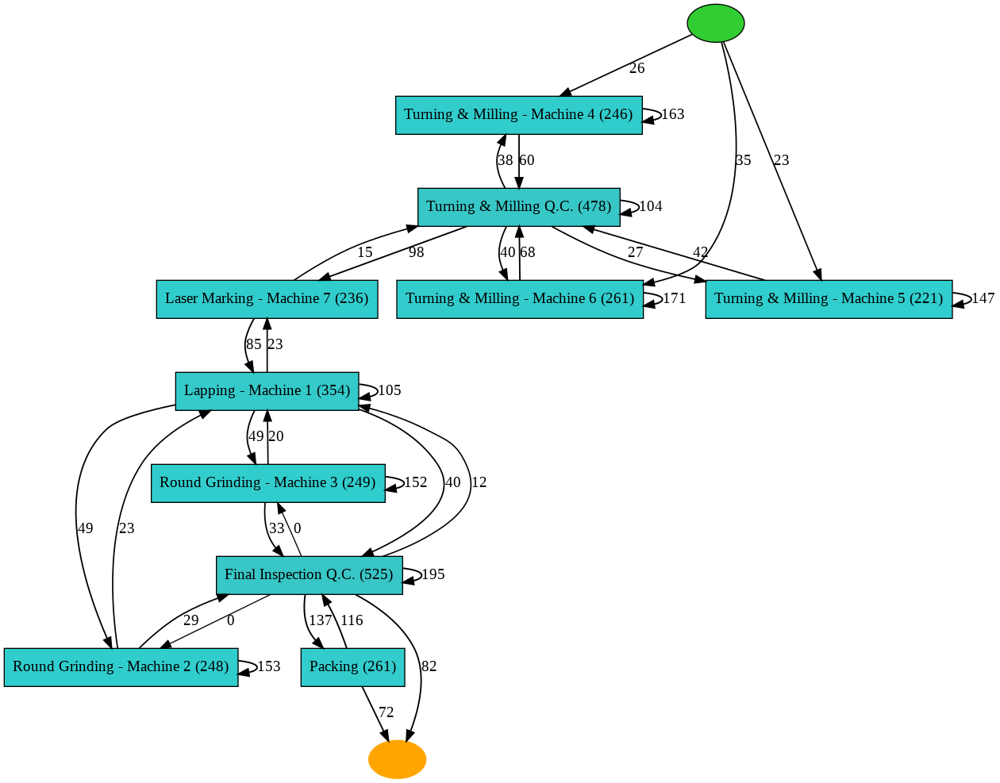

In [ ]:
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer

'''
매개변수 이름	                |               의미
DEPENDENCY_THRESH	            | dependency threshold of the Heuristics Miner (default: 0.5)
AND_MEASURE_THRESH	          | AND measure threshold of the Heuristics Miner (default: 0.65)
MIN_ACT_COUNT	                | minimum number of occurrences of an activity to be considered (default: 1)
MIN_DFG_OCCURRENCES	          | minimum number of occurrences of an edge to be considered (default: 1)
DFG_PRE_CLEANING_NOISE_THRESH	| cleaning threshold of the DFG (in order to remove weaker edges, default 0.05)
LOOP_LENGTH_TWO_THRESH	      | thresholds for the loops of length 2
'''
heu_net = heuristics_miner.apply_heu(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 200,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 20,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.DFG_PRE_CLEANING_NOISE_THRESH: 0.1})
gviz = hn_visualizer.apply(heu_net)
hn_visualizer.view(gviz)

hn_visualizer.save(gviz, "heuristic_norework.png")

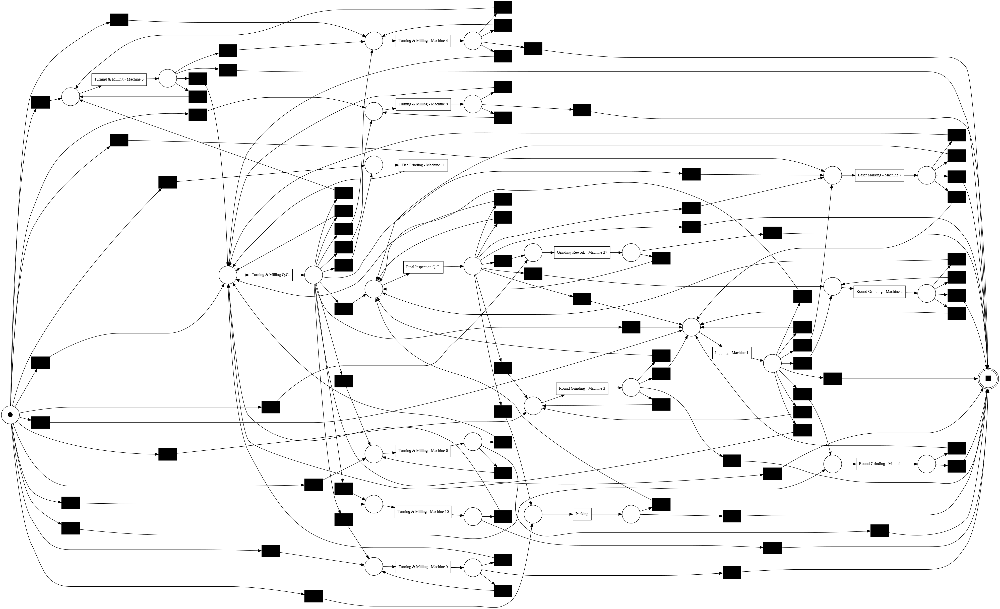

In [ ]:
# To obtain a Petri Net
net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})

from pm4py.visualization.petri_net import visualizer as pn_visualizer
gviz = pn_visualizer.apply(net, im, fm)
pn_visualizer.view(gviz)

### Directly-Follows Graph

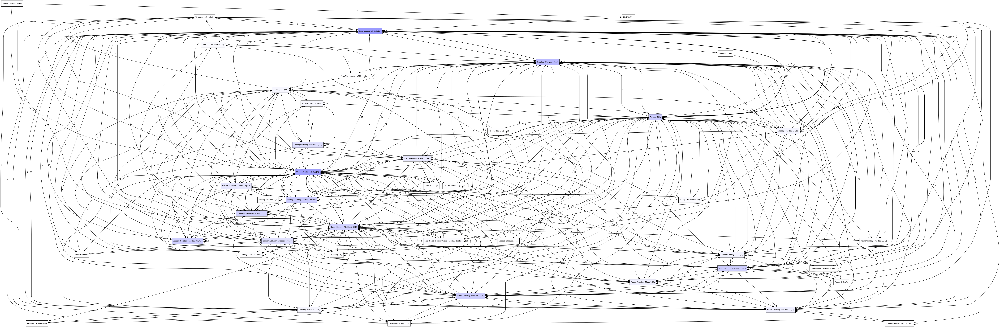

In [ ]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)

from pm4py.visualization.dfg import visualizer as dfg_visualization
gviz = dfg_visualization.apply(dfg, log=event_log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)

# 이미지로 저장
dfg_visualization.save(gviz, "dfg.png")

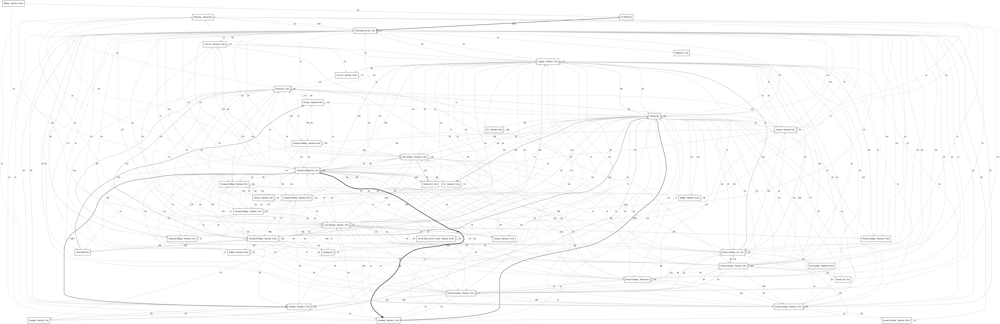

In [ ]:
dfg = dfg_discovery.apply(event_log, variant=dfg_discovery.Variants.PERFORMANCE)
gviz = dfg_visualization.apply(dfg, log=event_log, variant=dfg_visualization.Variants.PERFORMANCE)
dfg_visualization.view(gviz)

# 이미지로 저장
dfg_visualization.save(gviz, "dfg.png")

### Correlation Miner

In [ ]:
# caseID drop
event_df_cDrop = event_df.iloc[:, 1:]
event_df_cDrop

,rework,concept:name,time:timestamp,time:complete,time:span,resource,worker_id,qty:order,qty:completed,qty:rejected,qty:mrb,component,report_type,@@index
781,0,Turning & Milling - Machine 4,2012-01-29 23:24:00+00:00,2012-01-30 05:43:00+00:00,006:19,Machine 4 - Turning & Milling,ID4932,10,1,0,0,Cable Head,S,781
782,0,Turning & Milling Q.C.,2012-01-31 13:20:00+00:00,2012-01-31 14:50:00+00:00,001:30,Quality Check 1,ID4163,10,9,1,0,Cable Head,D,782
783,0,Laser Marking - Machine 7,2012-02-01 08:18:00+00:00,2012-02-01 08:27:00+00:00,000:09,Machine 7- Laser Marking,ID0998,10,9,0,0,Cable Head,D,783
784,0,Lapping - Machine 1,2012-02-14 00:00:00+00:00,2012-02-14 01:15:00+00:00,000:00,Machine 1 - Lapping,ID4882,10,0,0,0,Cable Head,D,784
785,0,Round Grinding - Machine 3,2012-02-14 09:13:00+00:00,2012-02-14 13:37:00+00:00,004:24,Machine 3 - Round Grinding,ID4445,10,0,0,0,Cable Head,S,785
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,0,Turning & Milling Q.C.,2012-03-22 11:59:00+00:00,2012-03-22 16:03:00+00:00,004:04,Quality Check 1,ID4618,507,0,0,0,Drill,D,939
940,0,Lapping - Machine 1,2012-03-26 00:00:00+00:00,2012-03-26 01:15:00+00:00,000:00,Machine 1 - Lapping,ID4882,507,0,0,0,Drill,D,940
941,0,Laser Marking - Machine 7,2012-03-26 09:14:00+00:00,2012-03-26 10:12:00+00:00,000:58,Machine 7- Laser Marking,ID0998,507,160,0,0,Drill,D,941
942,0,Final Inspection Q.C.,2012-03-28 17:35:00+00:00,2012-03-28 17:59:00+00:00,000:24,Quality Check 1,ID4618,507,0,0,0,Drill,D,942


In [ ]:
from pm4py.algo.discovery.correlation_mining import algorithm as correlation_miner

frequency_dfg, performance_dfg = correlation_miner.apply(event_df_cDrop, parameters={correlation_miner.Variants.CLASSIC.value.Parameters.ACTIVITY_KEY: "concept:name",
                                correlation_miner.Variants.CLASSIC.value.Parameters.TIMESTAMP_KEY: "time:timestamp"})
activities_freq = dict(event_df_cDrop["concept:name"].value_counts())

In [ ]:
from pm4py.visualization.dfg import visualizer as dfg_visualizer
gviz_freq = dfg_visualizer.apply(frequency_dfg, variant=dfg_visualizer.Variants.FREQUENCY, activities_count=activities_freq, parameters={"format": "png"})
gviz_perf = dfg_visualizer.apply(performance_dfg, variant=dfg_visualizer.Variants.PERFORMANCE, activities_count=activities_freq, parameters={"format": "png"})

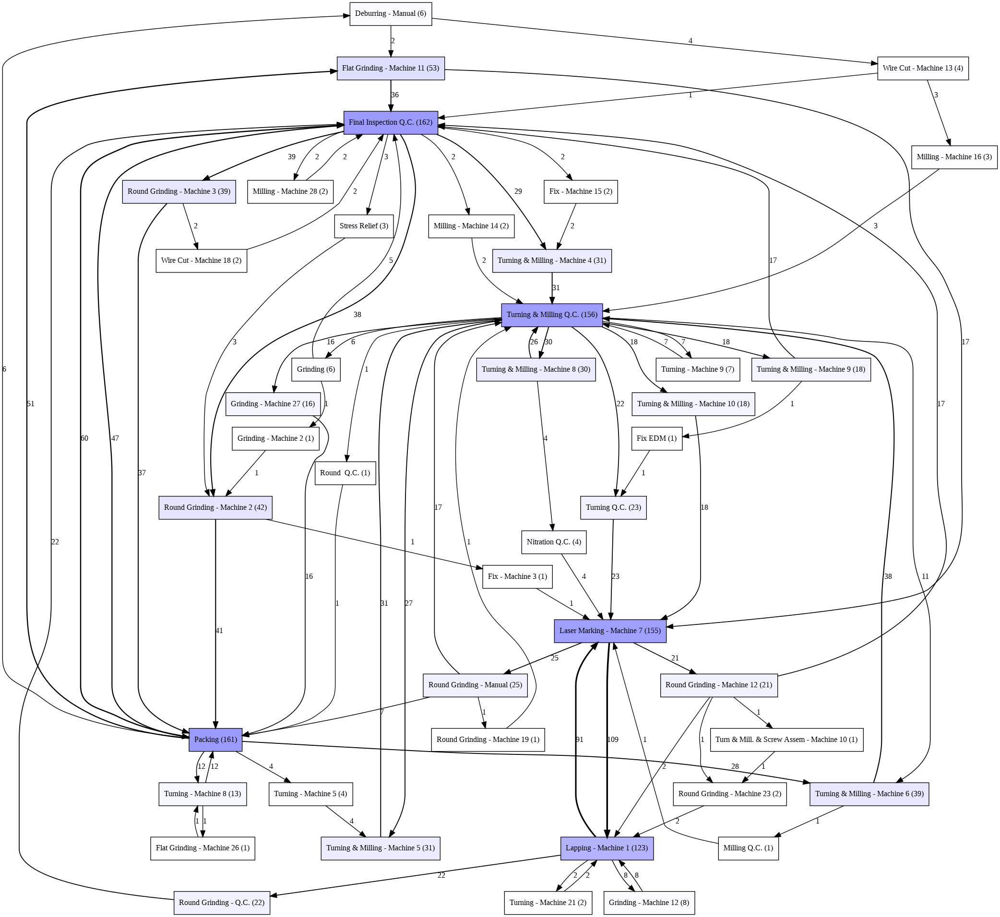

In [ ]:
dfg_visualizer.view(gviz_freq)

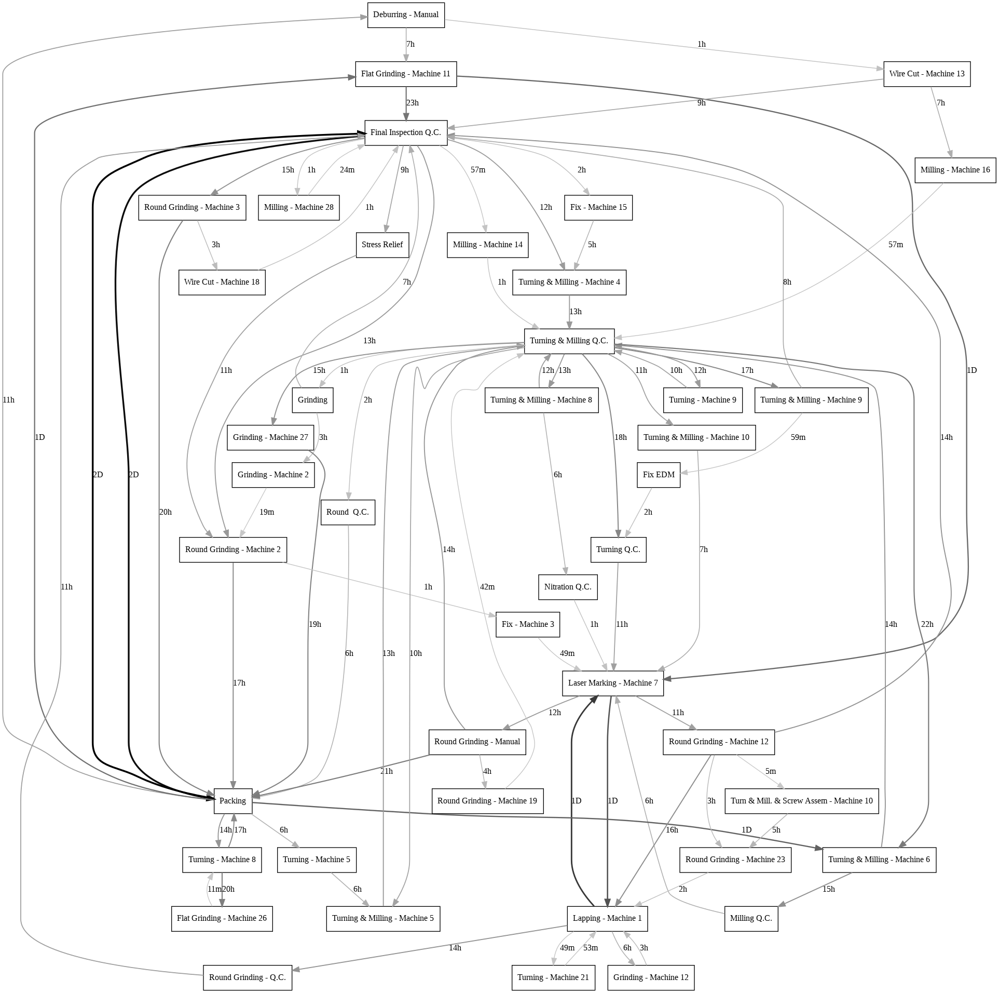

In [ ]:
dfg_visualizer.view(gviz_perf)

### inductive miner

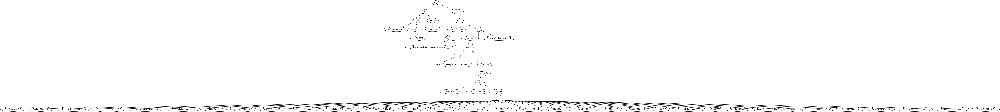

In [ ]:
#inductive miner - process tree
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
net, im, fm = inductive_miner.apply(event_log)
tree = inductive_miner.apply_tree(event_log)

gviz = pt_visualizer.apply(tree)
pt_visualizer.view(gviz)
pt_visualizer.save(gviz, "inductive_tree.png")

In [ ]:
#inductivie miner - petri net
from pm4py.objects.conversion.process_tree import converter as pt_converter
net, im, fm = pt_converter.apply(tree, variant=pt_converter.Variants.TO_PETRI_NET)
pm4py.view_petri_net(net,im,fm)

In [ ]:
#adding information about frequency/performance
#mining으로 얻은 net, im, fm을 replay해서 frequency/performance 기준으로 그리기
#pn_visualizer.Variants.FREQUENCY
from pm4py.visualization.petri_net import visualizer as pn_visualizer
parameters = {pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
gviz = pn_visualizer.apply(net, im, fm, parameters=parameters, variant=pn_visualizer.Variants.FREQUENCY, log=log)
#pn_visualizer.save(gviz, "inductive_frequency.png")
pt_visualizer.view(gviz)

In [ ]:
#pn_visualizer.Variants.WO_DECORATION
from pm4py.visualization.petri_net import visualizer as pn_visualizer
parameters = {pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
gviz = pn_visualizer.apply(net, im, fm, parameters=parameters, variant=pn_visualizer.Variants.WO_DECORATION, log=log)
#pn_visualizer.save(gviz, "inductive_frequency.png")
pt_visualizer.view(gviz)

In [ ]:
#pn_visualizer.Variants.PERFORMANCE
from pm4py.visualization.petri_net import visualizer as pn_visualizer
parameters = {pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
gviz = pn_visualizer.apply(net, im, fm, parameters=parameters, variant=pn_visualizer.Variants.PERFORMANCE, log=log)
#pn_visualizer.save(gviz, "inductive_frequency.png")
pt_visualizer.view(gviz)

# Comformance Chceking

In [ ]:
from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter
import matplotlib.pyplot as plt

# 원본데이터
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/activity_name_modified_data(rework).csv')
# 수정데이터
data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_end_activity_deleted_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data.csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/column_name_modified_data(noRework).csv')
data = data.iloc[:, 1:]
data = dataframe_utils.convert_timestamp_columns_in_df(data)
data = data.sort_values('time:timestamp')
# 데이터프레임 형태
event_log_pm4py = pm4py.format_dataframe(data, case_id='case:concept:name', activity_key='concept:name',
                                         timestamp_key='time:timestamp', timest_format='%Y-%m-%d %H:%M:%S%z')
event_df = event_log_pm4py
# 로그 형태
event_log = log_converter.apply(event_log_pm4py)

### Token-based Replay

In [ ]:
from pm4py.algo.conformance.tokenreplay import algorithm as token_replay

In [ ]:
# alpha-miner
from pm4py.algo.discovery.alpha import algorithm as alpha_miner

net, initial_marking, final_marking = alpha_miner.apply(event_log)
replayed_traces = token_replay.apply(event_log, net, initial_marking, final_marking)

replaying log with TBR, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

In [ ]:
# 원본데이터: 0.2216095785363153
# 수정데이터: 0.2543180539868393
fitness = 0
for i in range(len(replayed_traces)):
  fitness = fitness + replayed_traces[i]['trace_fitness']
fitness/len(replayed_traces)

0.2543180539868393

In [ ]:
# Heuristic miner
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner

net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})
replayed_traces = token_replay.apply(event_log, net, im, fm)

replaying log with TBR, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

In [ ]:
# 원본데이터: 0.9123767647970837
# 수정데이터: 0.9005389008702234
fitness = 0
for i in range(len(replayed_traces)):
  fitness = fitness + replayed_traces[i]['trace_fitness']
fitness/len(replayed_traces)

0.9005389008702234

In [ ]:
# inductive miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
net, im, fm = inductive_miner.apply(event_log)
replayed_traces = token_replay.apply(event_log, net, im, fm)

replaying log with TBR, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

In [ ]:
# 원본데이터: 1.0
# 수정데이터: 1.0
fitness = 0
for i in range(len(replayed_traces)):
  fitness = fitness + replayed_traces[i]['trace_fitness']
fitness/len(replayed_traces)

1.0

### Alignment

In [ ]:
# Heuristic Miner
net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})

from pm4py.visualization.petri_net import visualizer as pn_visualizer
Heu_gviz = pn_visualizer.apply(net, im, fm)
# pn_visualizer.view(gviz)

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness
from pm4py.algo.conformance.alignments.petri_net import algorithm as alignments
parameters = {heuristics_miner.Variants.CLASSIC.value.Parameters.ACTIVITY_KEY: "concept:name", alignments.Variants.VERSION_STATE_EQUATION_A_STAR.value.Parameters.ACTIVITY_KEY: "concept:name"}

aligned_traces = alignments.apply_log(event_log, net, im, fm, parameters=parameters)
log_fitness = replay_fitness.evaluate(aligned_traces, variant=replay_fitness.Variants.ALIGNMENT_BASED)

# 수정데이터
print(log_fitness)

aligning log, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

{'percFitTraces': 20.297029702970296, 'averageFitness': 0.7685101413413646, 'percentage_of_fitting_traces': 20.297029702970296, 'average_trace_fitness': 0.7685101413413646, 'log_fitness': 0.758946539907444}


In [ ]:
# DFG
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)
from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness

dfg, sa, ea = pm4py.discover_directly_follows_graph(event_log)
activities_count = pm4py.get_event_attribute_values(event_log, "concept:name")

from pm4py.algo.conformance.alignments.dfg import algorithm as dfg_alignment
alignments = dfg_alignment.apply(event_log, dfg, sa, ea)

# aligned_traces = alignments.apply_log(event_log, net, im, fm, parameters=parameters)
log_fitness = replay_fitness.evaluate(alignments, variant=replay_fitness.Variants.ALIGNMENT_BASED)

# 수정데이터
print(log_fitness)

{'percFitTraces': 100.0, 'averageFitness': 1.0, 'percentage_of_fitting_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0}


In [ ]:
# Inductive Miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter

net, im, fm = inductive_miner.apply(event_log)

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness
from pm4py.algo.conformance.alignments.petri_net import algorithm as alignments
parameters = {inductive_miner.Variants.IM.value.Parameters.ACTIVITY_KEY: "concept:name", alignments.Variants.VERSION_STATE_EQUATION_A_STAR.value.Parameters.ACTIVITY_KEY: "concept:name"}

aligned_traces = alignments.apply_log(event_log, net, im, fm, parameters=parameters)
log_fitness = replay_fitness.evaluate(aligned_traces, variant=replay_fitness.Variants.ALIGNMENT_BASED)

# 수정데이터
print(log_fitness)

aligning log, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

{'percFitTraces': 100.0, 'averageFitness': 1.0, 'percentage_of_fitting_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9997037462130727}


In [ ]:
parameters = {inductive_miner.Variants.IM.value.Parameters.ACTIVITY_KEY: "concept:name", alignments.Variants.VERSION_STATE_EQUATION_A_STAR.value.Parameters.ACTIVITY_KEY: "concept:name"}

net, initial_marking, final_marking = inductive_miner.apply(event_log, parameters=parameters)
aligned_traces = alignments.apply_log(event_log, net, initial_marking, final_marking, parameters=parameters)

from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness
log_fitness = replay_fitness.evaluate(aligned_traces, variant=replay_fitness.Variants.ALIGNMENT_BASED)

# 원본데이터
print(log_fitness)

aligning log, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

{'percFitTraces': 100.0, 'averageFitness': 1.0, 'percentage_of_fitting_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9997037462130727}


In [ ]:
parameters = {inductive_miner.Variants.IM.value.Parameters.ACTIVITY_KEY: "concept:name", alignments.Variants.VERSION_STATE_EQUATION_A_STAR.value.Parameters.ACTIVITY_KEY: "concept:name"}

net, initial_marking, final_marking = inductive_miner.apply(event_log, parameters=parameters)
aligned_traces = alignments.apply_log(event_log, net, initial_marking, final_marking, parameters=parameters)

from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness
log_fitness = replay_fitness.evaluate(aligned_traces, variant=replay_fitness.Variants.ALIGNMENT_BASED)

# 수정데이터
print(log_fitness)

aligning log, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

{'percFitTraces': 100.0, 'averageFitness': 1.0, 'percentage_of_fitting_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9997037462130727}


### decomposition of alignment

In [ ]:
from pm4py.algo.conformance.alignments.decomposed import algorithm as decomp_alignments
conf = decomp_alignments.apply(event_log, net, initial_marking, final_marking, parameters={decomp_alignments.Variants.RECOMPOS_MAXIMAL.value.Parameters.PARAM_THRESHOLD_BORDER_AGREEMENT: 2})

aligning log with decomposition/recomposition, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as rp_fitness_evaluator
fitness = rp_fitness_evaluator.evaluate(conf, variant=rp_fitness_evaluator.Variants.ALIGNMENT_BASED)

In [ ]:
# Heuristic Miner
net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})

from pm4py.visualization.petri_net import visualizer as pn_visualizer
Heu_gviz = pn_visualizer.apply(net, im, fm)
# pn_visualizer.view(gviz)

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness
from pm4py.algo.conformance.alignments.decomposed import algorithm as decomp_alignments
from pm4py.algo.evaluation.replay_fitness import algorithm as rp_fitness_evaluator

conf = decomp_alignments.apply(event_log, net, im, fm, parameters={decomp_alignments.Variants.RECOMPOS_MAXIMAL.value.Parameters.PARAM_THRESHOLD_BORDER_AGREEMENT: 2})
fitness = rp_fitness_evaluator.evaluate(conf, variant=rp_fitness_evaluator.Variants.ALIGNMENT_BASED)
fitness

aligning log with decomposition/recomposition, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

{'averageFitness': 0.864328398791627,
 'average_trace_fitness': 0.864328398791627,
 'log_fitness': 0.8502949814986124,
 'percFitTraces': 29.702970297029704,
 'percentage_of_fitting_traces': 29.702970297029704}

In [ ]:
# DFG
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)
from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)

In [ ]:
# from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness
# from pm4py.algo.conformance.alignments.decomposed import algorithm as decomp_alignments

# conf = decomp_alignments.apply(event_log, net, im, fm, parameters={decomp_alignments.Variants.RECOMPOS_MAXIMAL.value.Parameters.PARAM_THRESHOLD_BORDER_AGREEMENT: 2})

dfg, sa, ea = pm4py.discover_directly_follows_graph(event_log)

from pm4py.algo.simulation.playout.dfg import algorithm as dfg_playout
parameters = {}
simulated_log = dfg_playout.apply(dfg, sa, ea, parameters=parameters)

from pm4py.algo.conformance.alignments.dfg import algorithm as dfg_alignment
from pm4py.algo.evaluation.replay_fitness import algorithm as rp_fitness_evaluator

alignments = dfg_alignment.apply(simulated_log, dfg, sa, ea)
fitness = rp_fitness_evaluator.evaluate(alignments, variant=rp_fitness_evaluator.Variants.ALIGNMENT_BASED)
fitness

{'averageFitness': 1.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percFitTraces': 100.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
# Inductive Miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter

net, im, fm = inductive_miner.apply(event_log)

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness
from pm4py.algo.conformance.alignments.decomposed import algorithm as decomp_alignments
from pm4py.algo.evaluation.replay_fitness import algorithm as rp_fitness_evaluator

conf = decomp_alignments.apply(event_log, net, im, fm, parameters={decomp_alignments.Variants.RECOMPOS_MAXIMAL.value.Parameters.PARAM_THRESHOLD_BORDER_AGREEMENT: 2})
fitness = rp_fitness_evaluator.evaluate(conf, variant=rp_fitness_evaluator.Variants.ALIGNMENT_BASED)
fitness

aligning log with decomposition/recomposition, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

{'averageFitness': 1.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 0.9997037360504609,
 'percFitTraces': 100.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
# 수정데이터
fitness

{'averageFitness': 1.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 0.9997037360504609,
 'percFitTraces': 100.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as rp_fitness_evaluator
# 원본데이터
fitness = rp_fitness_evaluator.evaluate(conf, variant=rp_fitness_evaluator.Variants.ALIGNMENT_BASED)
fitness

{'averageFitness': 1.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 0.9997037360504609,
 'percFitTraces': 100.0,
 'percentage_of_fitting_traces': 100.0}

### Footprint(x)

In [ ]:
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.algo.discovery.footprints import algorithm as footprints_discovery
from pm4py.visualization.footprints import visualizer as fp_visualizer

net, im, fm = inductive_miner.apply(event_log)
fp_net = footprints_discovery.apply(net, im, fm)

fp_log = footprints_discovery.apply(event_log, variant=footprints_discovery.Variants.ENTIRE_EVENT_LOG)

In [ ]:
fp_trace_by_trace = footprints_discovery.apply(event_log, variant=footprints_discovery.Variants.TRACE_BY_TRACE)

In [ ]:
gviz = fp_visualizer.apply(fp_net, parameters={fp_visualizer.Variants.SINGLE.value.Parameters.FORMAT: "svg"})
fp_visualizer.view(gviz)

In [ ]:
gviz = fp_visualizer.apply(fp_log, fp_net, parameters={fp_visualizer.Variants.COMPARISON.value.Parameters.FORMAT: "png"})
fp_visualizer.view(gviz)

In [ ]:
import os
from copy import deepcopy
from pm4py.algo.filtering.log.variants import variants_filter

filtered_log = variants_filter.apply_auto_filter(deepcopy(event_log))
net, im, fm = inductive_miner.apply(filtered_log)

fp_trace_by_trace = footprints_discovery.apply(filtered_log, variant=footprints_discovery.Variants.TRACE_BY_TRACE)
fp_net = footprints_discovery.apply(net, im, fm)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecatedWarning: apply_auto_filter is deprecated as of 2.2.11 and will be removed in 3.0.0. Removed
  """


In [ ]:
from pm4py.algo.conformance.footprints import algorithm as footprints_conformance

conf_fp = footprints_conformance.apply(fp_trace_by_trace, fp_net)
conf_fp

[set(), set(), set(), set(), set(), set(), set()]

### Log Skeleton

In [ ]:
from pm4py.algo.discovery.log_skeleton import algorithm as lsk_discovery
# skeleton = lsk_discovery.apply(event_log, parameters={lsk_discovery.Variants.CLASSIC.value.Parameters.NOISE_THRESHOLD: 0.0})
skeleton = lsk_discovery.apply(event_log, parameters={lsk_discovery.Variants.CLASSIC.value.Parameters.NOISE_THRESHOLD: 0.03})


In [ ]:
skeleton.keys()

dict_keys(['equivalence', 'always_after', 'always_before', 'never_together', 'directly_follows', 'activ_freq'])

In [ ]:
skeleton['equivalence']

{('Fix EDM', 'Milling - Machine 14'),
 ('Fix EDM', 'Milling - Machine 28'),
 ('Fix EDM', 'Milling Q.C.'),
 ('Fix EDM', 'Packing'),
 ('Flat Grinding - Machine 26', 'Final Inspection Q.C.'),
 ('Flat Grinding - Machine 26', 'Packing'),
 ('Flat Grinding - Machine 26', 'Round Grinding - Q.C.'),
 ('Milling - Machine 28', 'Packing'),
 ('Milling Q.C.', 'Fix EDM'),
 ('Milling Q.C.', 'Milling - Machine 14'),
 ('Milling Q.C.', 'Milling - Machine 28'),
 ('Milling Q.C.', 'Packing')}

In [ ]:
skeleton['always_after']

{('Fix EDM', 'Final Inspection Q.C.'),
 ('Fix EDM', 'Milling - Machine 14'),
 ('Fix EDM', 'Milling Q.C.'),
 ('Fix EDM', 'Packing'),
 ('Flat Grinding - Machine 26', 'Final Inspection Q.C.'),
 ('Flat Grinding - Machine 26', 'Packing'),
 ('Grinding - Machine 12', 'Final Inspection Q.C.'),
 ('Grinding - Machine 12', 'Packing'),
 ('Milling - Machine 28', 'Final Inspection Q.C.'),
 ('Milling - Machine 28', 'Milling - Machine 14'),
 ('Milling - Machine 28', 'Packing'),
 ('Milling Q.C.', 'Final Inspection Q.C.'),
 ('Milling Q.C.', 'Milling - Machine 14'),
 ('Milling Q.C.', 'Packing'),
 ('Nitration Q.C.', 'Final Inspection Q.C.'),
 ('Nitration Q.C.', 'Lapping - Machine 1'),
 ('Nitration Q.C.', 'Laser Marking - Machine 7'),
 ('Nitration Q.C.', 'Packing'),
 ('Stress Relief', 'Laser Marking - Machine 7'),
 ('Turning - Machine 21', 'Final Inspection Q.C.'),
 ('Turning - Machine 21', 'Grinding - Machine 27'),
 ('Turning - Machine 21', 'Lapping - Machine 1'),
 ('Turning - Machine 21', 'Laser Marking 

In [ ]:
from pm4py.algo.conformance.log_skeleton import algorithm as lsk_conformance
skeleton = lsk_discovery.apply(event_log, parameters={lsk_discovery.Variants.CLASSIC.value.Parameters.NOISE_THRESHOLD: 0.0})

conf_result = lsk_conformance.apply(event_log, skeleton)
# for trace in conf_result:
#     print(trace)
conf_result[0]

{'dev_fitness': 1.0,
 'deviations': [],
 'is_fit': True,
 'no_constr_total': 57,
 'no_dev_total': 0}

In [ ]:
from pm4py.algo.conformance.log_skeleton import algorithm as lsk_conformance
skeleton = lsk_discovery.apply(event_log, parameters={lsk_discovery.Variants.CLASSIC.value.Parameters.NOISE_THRESHOLD: 0.03})

conf_result = lsk_conformance.apply(event_log, skeleton)
# for trace in conf_result:
#     print(trace)
conf_result[0]

{'dev_fitness': 1.0,
 'deviations': [],
 'is_fit': True,
 'no_constr_total': 194,
 'no_dev_total': 0}

### Alignments between Logs(x)

In [ ]:
# performing an optimal alignment between an event log and a process model might be unfeasible.
# 최적의 alignment를 찾는 것이 어려울 경우 대략적인 alignment를 찾기
net, im, fm = pm4py.discover_petri_net_inductive(event_log)

from pm4py.algo.simulation.playout.petri_net import algorithm as simulator
simulated_log = simulator.apply(net, im, fm)

In [ ]:
from pm4py.algo.conformance.alignments.edit_distance import algorithm as logs_alignments
parameters = {}
alignments = logs_alignments.apply(event_log, simulated_log, parameters=parameters)

In [ ]:
alignments[0]

{'alignment': [('Turning & Milling - Machine 4',
   'Turning & Milling - Machine 4'),
  ('Turning & Milling - Machine 4', 'Turning & Milling - Machine 4'),
  ('Turning & Milling - Machine 4', 'Turning & Milling - Machine 4'),
  ('>>', 'Turn & Mill. & Screw Assem - Machine 10'),
  ('>>', 'Turn & Mill. & Screw Assem - Machine 10'),
  ('>>', 'Turn & Mill. & Screw Assem - Machine 10'),
  ('Turning & Milling - Machine 4', 'Turning & Milling - Machine 4'),
  ('Turning & Milling Q.C.', '>>'),
  ('Laser Marking - Machine 7', '>>'),
  ('Lapping - Machine 1', '>>'),
  ('Lapping - Machine 1', '>>'),
  ('Lapping - Machine 1', '>>'),
  ('Lapping - Machine 1', '>>'),
  ('Round Grinding - Machine 3', '>>'),
  ('Round Grinding - Machine 3', '>>'),
  ('Final Inspection Q.C.', '>>'),
  ('Final Inspection Q.C.', '>>'),
  ('Final Inspection Q.C.', '>>'),
  ('Packing', '>>'),
  ('>>', 'Turn & Mill. & Screw Assem - Machine 10'),
  ('>>', 'Turn & Mill. & Screw Assem - Machine 10'),
  ('>>', 'Turning & Millin

In [ ]:
parameters = {logs_alignments.Variants.EDIT_DISTANCE.value.Parameters.PERFORM_ANTI_ALIGNMENT: True}
alignments = logs_alignments.apply(event_log, simulated_log, parameters=parameters)

In [ ]:
alignments[0]

{'alignment': [('Turning & Milling - Machine 4', '>>'),
  ('Turning & Milling - Machine 4', '>>'),
  ('Turning & Milling - Machine 4', '>>'),
  ('Turning & Milling - Machine 4', '>>'),
  ('Turning & Milling Q.C.', '>>'),
  ('Laser Marking - Machine 7', '>>'),
  ('Lapping - Machine 1', '>>'),
  ('Lapping - Machine 1', '>>'),
  ('Lapping - Machine 1', '>>'),
  ('Lapping - Machine 1', '>>'),
  ('Round Grinding - Machine 3', '>>'),
  ('Round Grinding - Machine 3', '>>'),
  ('Final Inspection Q.C.', '>>'),
  ('Final Inspection Q.C.', '>>'),
  ('Final Inspection Q.C.', '>>'),
  ('Packing', '>>'),
  ('>>', 'Milling - Machine 28'),
  ('>>', 'Fix EDM'),
  ('>>', 'Turning & Milling - Machine 5'),
  ('>>', 'Turn & Mill. & Screw Assem - Machine 10'),
  ('>>', 'Turning - Machine 9'),
  ('>>', 'Turning - Machine 9'),
  ('>>', 'Turning & Milling - Machine 5'),
  ('>>', 'Turning & Milling - Machine 5'),
  ('>>', 'Turning & Milling - Machine 5'),
  ('>>', 'Milling - Machine 16'),
  ('>>', 'Turning - Ma

# Evaluation

In [ ]:
from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter

data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/activity_name_modified_data(rework).csv')
# data = pd.read_csv('/content/drive/MyDrive/데스팀플/data/start_x_rework_x.csv')
data = data.iloc[:, 1:]
data = dataframe_utils.convert_timestamp_columns_in_df(data)
data = data.sort_values('time:timestamp')
# 데이터프레임 형태
event_log_pm4py = pm4py.format_dataframe(data, case_id='case:concept:name', activity_key='concept:name',
                                         timestamp_key='time:timestamp', timest_format='%Y-%m-%d %H:%M:%S%z')
event_df = event_log_pm4py
# 로그 형태
event_log = log_converter.apply(event_log_pm4py)

In [ ]:
# Heuristic Miner
net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})

from pm4py.visualization.petri_net import visualizer as pn_visualizer
Heu_gviz = pn_visualizer.apply(net, im, fm)
# pn_visualizer.view(gviz)

In [ ]:
# DFG
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)
from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)

In [ ]:
# Inductive Miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter

net, im, fm = inductive_miner.apply(event_log)

### Fitness

#### token_based

activity_name_modified_data(rework).csv

In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
fitness

replaying log with TBR, completed variants ::   0%|          | 0/219 [00:00<?, ?it/s]

{'average_trace_fitness': 0.9123767647970837,
 'log_fitness': 0.9302413749526096,
 'perc_fit_traces': 30.044843049327355,
 'percentage_of_fitting_traces': 30.044843049327355}

In [ ]:
# DFG
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
fitness

replaying log with TBR, completed variants ::   0%|          | 0/219 [00:00<?, ?it/s]

{'average_trace_fitness': 0.8106945683115669,
 'log_fitness': 0.9069031032298923,
 'perc_fit_traces': 0.0,
 'percentage_of_fitting_traces': 0.0}

In [ ]:
# Inductive Miner
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
fitness

replaying log with TBR, completed variants ::   0%|          | 0/219 [00:00<?, ?it/s]

{'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'perc_fit_traces': 100.0,
 'percentage_of_fitting_traces': 100.0}

start_x_rework_x.csv

In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
fitness

replaying log with TBR, completed variants ::   0%|          | 0/170 [00:00<?, ?it/s]

{'average_trace_fitness': 0.38765548258122545,
 'log_fitness': 0.3207364591209659,
 'perc_fit_traces': 6.930693069306931,
 'percentage_of_fitting_traces': 6.930693069306931}

In [ ]:
# DFG
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
fitness

replaying log with TBR, completed variants ::   0%|          | 0/170 [00:00<?, ?it/s]

{'average_trace_fitness': 0.6574372409768434,
 'log_fitness': 0.7279005524861879,
 'perc_fit_traces': 0.0,
 'percentage_of_fitting_traces': 0.0}

In [ ]:
# Inductive Miner
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
fitness

replaying log with TBR, completed variants ::   0%|          | 0/170 [00:00<?, ?it/s]

{'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'perc_fit_traces': 100.0,
 'percentage_of_fitting_traces': 100.0}

#### alignment_based

In [ ]:
# Heuristic Miner
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer

net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})

from pm4py.visualization.petri_net import visualizer as pn_visualizer
Heu_gviz = pn_visualizer.apply(net, im, fm)
# pn_visualizer.view(gviz)

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.ALIGNMENT_BASED)
fitness

aligning log, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

{'averageFitness': 0.7685101413413646,
 'average_trace_fitness': 0.7685101413413646,
 'log_fitness': 0.758946539907444,
 'percFitTraces': 20.297029702970296,
 'percentage_of_fitting_traces': 20.297029702970296}

In [ ]:
# DFG
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)
from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.ALIGNMENT_BASED)
fitness

Exception: ignored

In [ ]:
# Inductive Miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter

net, im, fm = inductive_miner.apply(event_log)

In [ ]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
fitness = replay_fitness_evaluator.apply(event_log, net, im, fm, variant=replay_fitness_evaluator.Variants.ALIGNMENT_BASED)
fitness

NameError: ignored

### Pricision

#### ETCONFORMANCE_TOKEN

activity_name_modified_data(rework).csv

In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
prec

replaying log with TBR, completed variants ::   0%|          | 0/3544 [00:00<?, ?it/s]

0.3919345098302355

In [ ]:
# DFG
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
prec

replaying log with TBR, completed variants ::   0%|          | 0/3544 [00:00<?, ?it/s]

0.4552102376599635

In [ ]:
# Inductive Miner
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
prec

replaying log with TBR, completed variants ::   0%|          | 0/3544 [00:00<?, ?it/s]

0.05870945942637196

start_x_rework_x.csv


In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
prec

replaying log with TBR, completed variants ::   0%|          | 0/560 [00:00<?, ?it/s]

0.31088689039994155

In [ ]:
# DFG
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)
from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)

from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
prec

replaying log with TBR, completed variants ::   0%|          | 0/3207 [00:00<?, ?it/s]

0.29726775956284157

In [ ]:
# Inductive Miner
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
prec

replaying log with TBR, completed variants ::   0%|          | 0/560 [00:00<?, ?it/s]

0.1292044412753387

#### ALIGN_ETCONFORMANCE

In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator

net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})

prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ALIGN_ETCONFORMANCE)
prec

computing precision with alignments, completed variants ::   0%|          | 0/3207 [00:00<?, ?it/s]

0.49094522968197885

In [ ]:
# DFG
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)
from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)

# dfg, sa, ea = pm4py.discover_directly_follows_graph(event_log)

# from pm4py.algo.simulation.playout.dfg import algorithm as dfg_playout
# parameters = {}
# simulated_log = dfg_playout.apply(dfg, sa, ea, parameters=parameters)

# from pm4py.algo.conformance.alignments.dfg import algorithm as dfg_alignment
# from pm4py.algo.evaluation.replay_fitness import algorithm as rp_fitness_evaluator

# alignments = dfg_alignment.apply(simulated_log, dfg, sa, ea)
# fitness = rp_fitness_evaluator.evaluate(alignments, variant=rp_fitness_evaluator.Variants.ALIGNMENT_BASED)
# fitness
from pm4py.evaluation.precision import factory as precision_factory

# prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ALIGN_ETCONFORMANCE)
# prec

precision = precision_factory.apply(event_log, net, im, fm)
precision

ImportError: ignored

In [ ]:
# Inductive Miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter

net, im, fm = inductive_miner.apply(event_log)

prec = precision_evaluator.apply(event_log, net, im, fm, variant=precision_evaluator.Variants.ALIGN_ETCONFORMANCE)
prec

computing precision with alignments, completed variants ::   0%|          | 0/3207 [00:00<?, ?it/s]

0.053656883919874665

### Generalization

activity_name_modified_data(rework).csv

In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator

net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})

from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
gen = generalization_evaluator.apply(event_log, net, im, fm)
gen

replaying log with TBR, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

0.8012148365902665

In [ ]:
# DFG
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)
from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)

from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
gen = generalization_evaluator.apply(event_log, net, im, fm)
gen

replaying log with TBR, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

0.35062091796949235

In [ ]:
# Inductive Miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter

net, im, fm = inductive_miner.apply(event_log)

from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
gen = generalization_evaluator.apply(event_log, net, im, fm)
gen

replaying log with TBR, completed variants ::   0%|          | 0/198 [00:00<?, ?it/s]

0.7171786721507171

start_x_rework_x.csv

In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
gen = generalization_evaluator.apply(event_log, net, im, fm)
gen

replaying log with TBR, completed variants ::   0%|          | 0/170 [00:00<?, ?it/s]

0.5384725638370713

In [ ]:
# DFG
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
gen = generalization_evaluator.apply(event_log, net, im, fm)
gen

replaying log with TBR, completed variants ::   0%|          | 0/170 [00:00<?, ?it/s]

0.26953102532029327

In [ ]:
# Inductive Miner
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
gen = generalization_evaluator.apply(event_log, net, im, fm)
gen

replaying log with TBR, completed variants ::   0%|          | 0/170 [00:00<?, ?it/s]

0.5956730165027928

### Simplicity

activity_name_modified_data(rework).csv

In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator

net, im, fm = heuristics_miner.apply(event_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.99,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_ACT_COUNT: 10,
                                                            heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 10})
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simp = simplicity_evaluator.apply(net)
simp

0.509090909090909

In [ ]:
# DFG
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(event_log)
from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)

from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simp = simplicity_evaluator.apply(net)
simp

0.39375629405840884

In [ ]:
# Inductive Miner
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter

net, im, fm = inductive_miner.apply(event_log)

from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simp = simplicity_evaluator.apply(net)
simp

0.489795918367347

start_x_rework_x.csv

In [ ]:
# Heuristic Miner
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simp = simplicity_evaluator.apply(net)
simp

1.0

In [ ]:
# DFG
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simp = simplicity_evaluator.apply(net)
simp

0.429951690821256

In [ ]:
# Inductive Miner
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simp = simplicity_evaluator.apply(net)
simp

0.4358974358974359